In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import re
import sys
import astropy as ast
from astropy.io import ascii
import matplotlib.pyplot as plt
import pandas as pd
import glob
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from matplotlib.colors import LogNorm, Normalize
import gzip
import re
import csv
from tqdm import tqdm
# import pysynphot as S
from metrics import fit_plotter_flux, fit_plotter_flux_v2, mean_med_flux, mean_med_flux_v2, offset_warning, offset_warning_v2,compute_lomb_scargle, plot_periodogram,plot_phase_fold
from view_and_clean import individual_plotter, df_extract, individual_plotter_v2, df_extract_v2, offset_corrector
from metrics import sed_plotter, info

In [2]:
coords = pd.read_csv('merged_smc_lmc_coords.csv', comment='#', sep="\\s+", names=['RA', 'DEC'])
df_lmc = pd.read_csv('/Users/shannonbowes/Research/ysg/candidates_and_lcs/final_lmc_ysgcands.csv', comment='#') # , sep="\\s+"
df_smc = pd.read_csv('/Users/shannonbowes/Research/ysg/candidates_and_lcs/final_smc_ysgcands.csv', comment='#') # , sep="\\s+"
stats = pd.read_csv('summary_results15.csv')
# set serif font settings for plots
plt.rcParams['font.family'] = 'serif'

## BOSZ models

In [3]:
basepath = '/Users/shannonbowes/Research/ysg/candidates_and_lcs/2022_asassn_lc_data/pysynphot_data/grid/bosz/r2000/'
smcbasepath = '/Users/shannonbowes/Research/ysg/candidates_and_lcs/2022_asassn_lc_data/pysynphot_data/grid/bosz/r2000/m-0.75/'
lmcbasepath = '/Users/shannonbowes/Research/ysg/candidates_and_lcs/2022_asassn_lc_data/pysynphot_data/grid/bosz/r2000/m-0.25/'
wavelengths = np.loadtxt(os.path.join(basepath, 'bosz2024_wave_r2000.txt'))

In [4]:
def parse_bosz_filename(filename, smc=True):
    """
    Parse BOSZ filename to extract stellar parameters
    Example: bosz2024_ms_t4250_g+2.5_m-0.75_a+0.00_c+0.00_v2_r2000_resam.txt.gz
    """
    # Extract parameters using regex
    if smc:
        filename = os.path.join(smcbasepath, filename)
    else:
        filename = os.path.join(lmcbasepath, filename)
    pattern = r'bosz2024_([a-z]+)_t(\d+)_g([+-]?\d+\.?\d*)_m([+-]?\d+\.?\d*)_a([+-]?\d+\.?\d*)_c([+-]?\d+\.?\d*)_v(\d+)_r(\d+)'
    match = re.search(pattern, filename)
    
    if match:
        return {
            'class': match.group(1),
            'teff': int(match.group(2)),  # Temperature in K
            'logg': float(match.group(3)), # log(g)
            'metallicity': float(match.group(4)), # [M/H]
            'alpha': float(match.group(5)), # [α/Fe]
            'carbon': float(match.group(6)), # [C/Fe]
            'vturb': int(match.group(7)),   # Microturbulence km/s
            'resolution': int(match.group(8)) # Spectral resolution
        }
    return None

def find_bosz_models_by_temp(target_temp, temp_tolerance=250):
    """
    Find BOSZ models within temperature tolerance of target
    """
    bosz_dir = '/Users/shannonbowes/Research/ysg/candidates_and_lcs/2022_asassn_lc_data/pysynphot_data/grid/bosz/r2000'
    matching_models = []
    for metallicity_dir in ['m-0.75', 'm-0.25']:
        met_path = os.path.join(bosz_dir, metallicity_dir)
        if os.path.exists(met_path):
            for filename in os.listdir(met_path):
                if filename.endswith('.txt.gz'):
                    params = parse_bosz_filename(filename, smc=(metallicity_dir == 'm-0.75'))
                    if params and abs(params['teff'] - target_temp) <= temp_tolerance:
                        full_path = os.path.join(met_path, filename)
                        params['filepath'] = full_path
                        matching_models.append(params)
    return sorted(matching_models, key=lambda x: abs(x['teff'] - target_temp))


for temp in [4000, 5000, 6000]:
    models = find_bosz_models_by_temp(temp, temp_tolerance=500)
    print(f"\nModels near {temp}K (+/-500K):")
    for model in models[:3]:  # first 3 matches
        print(f"  Teff={model['teff']}K, log(g)={model['logg']}, [M/H]={model['metallicity']}")
parse_bosz_filename("m-0.25/bosz2024_ms_t4250_g+2.5_m-0.25_a+0.00_c+0.00_v2_r2000_resam.txt.gz")


Models near 4000K (+/-500K):
  Teff=4000K, log(g)=1.0, [M/H]=-0.75
  Teff=4000K, log(g)=2.5, [M/H]=-0.75
  Teff=4000K, log(g)=0.5, [M/H]=-0.75

Models near 5000K (+/-500K):
  Teff=5000K, log(g)=2.5, [M/H]=-0.75
  Teff=5000K, log(g)=1.0, [M/H]=-0.75
  Teff=5000K, log(g)=0.5, [M/H]=-0.75

Models near 6000K (+/-500K):
  Teff=6000K, log(g)=1.5, [M/H]=-0.75
  Teff=6000K, log(g)=2.0, [M/H]=-0.75
  Teff=6000K, log(g)=2.5, [M/H]=-0.75


{'class': 'ms',
 'teff': 4250,
 'logg': 2.5,
 'metallicity': -0.25,
 'alpha': 0.0,
 'carbon': 0.0,
 'vturb': 2,
 'resolution': 2000}

In [5]:
def browse_bosz_models(smc=True):
    """
    Interactive function to browse available BOSZ models
    """
    bosz_dir = os.path.join('/Users/shannonbowes/Research/ysg/candidates_and_lcs/2022_asassn_lc_data/pysynphot_data/grid/bosz/r2000')
    all_models = []
    if smc:
        metallicity_dir = 'm-0.75'
    else:
        metallicity_dir = 'm-0.25'

    met_path = os.path.join(bosz_dir, metallicity_dir)
    if os.path.exists(met_path):
        for filename in os.listdir(met_path):
            if filename.endswith('.txt.gz'):
                params = parse_bosz_filename(filename)
                if params:
                    params['filepath'] = os.path.join(met_path, filename)
                    all_models.append(params)
    # Sort by temperature
    all_models.sort(key=lambda x: x['teff'])
    print(f"Total BOSZ models available: {len(all_models)}")
    print("\nTemperature range:", all_models[0]['teff'], "K to", all_models[-1]['teff'], "K")
    print("log(g) range:", min(m['logg'] for m in all_models), "to", max(m['logg'] for m in all_models))
    print("Metallicity value:", sorted(list(set(m['metallicity'] for m in all_models))))
    return all_models

smc_bosz = browse_bosz_models(smc=True)
lmc_bosz = browse_bosz_models(smc=False)
print(f"\nSample BOSZ model:\n{smc_bosz[0]}")

Total BOSZ models available: 122

Temperature range: 4000 K to 14000 K
log(g) range: 0.0 to 3.0
Metallicity value: [-0.75]
Total BOSZ models available: 120

Temperature range: 4000 K to 14000 K
log(g) range: 0.0 to 3.0
Metallicity value: [-0.25]

Sample BOSZ model:
{'class': 'ms', 'teff': 4000, 'logg': 1.0, 'metallicity': -0.75, 'alpha': 0.0, 'carbon': 0.0, 'vturb': 2, 'resolution': 2000, 'filepath': '/Users/shannonbowes/Research/ysg/candidates_and_lcs/2022_asassn_lc_data/pysynphot_data/grid/bosz/r2000/m-0.75/bosz2024_ms_t4000_g+1.0_m-0.75_a+0.00_c+0.00_v2_r2000_resam.txt.gz'}


In [6]:
def plot_bosz_spectra_test(data):
    """
    Look at the non-dummy portion of BOSZ data to see if there's real spectrum data
    """
    col0 = data[:, 0]
    col1 = data[:, 1]
    
    # Create mask for wavelengths <= 40000 Angstroms
    mask = wavelengths <= 40000
    
    # Apply mask to get filtered data
    wave_filtered = wavelengths[mask]
    flux_filtered = col0[mask]
    continuum_filtered = col1[mask]
            
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    
    ax1.plot(wave_filtered, flux_filtered, 'b.-', markersize=1)
    ax1.set_title('Column 0 (Flux)')
    ax1.set_xlabel('Wavelength (Angstroms)')
    ax1.set_ylabel('Flux Value')
    ax1.grid(True)
    
    ax2.plot(wave_filtered, continuum_filtered, 'r.-', markersize=1)
    ax2.set_title('Column 1 (Continuum)')
    ax2.set_xlabel('Wavelength (Angstroms)')
    ax2.set_ylabel('Continuum Value')
    ax2.grid(True)
    
    plt.tight_layout()
    plt.show()
    
    print(f"Plotted {len(wave_filtered)} points out of {len(wavelengths)} total points")
    print(f"Wavelength range: {wave_filtered.min():.1f} - {wave_filtered.max():.1f} Angstroms")

# trial run
# data = np.loadtxt('/Users/shannonbowes/Research/ysg/candidates_and_lcs/2022_asassn_lc_data/pysynphot_data/grid/bosz/r2000/m-0.75/bosz2024_ms_t4250_g+2.5_m-0.75_a+0.00_c+0.00_v2_r2000_resam.txt.gz')
# plot_bosz_spectra_test(data)

/var/folders/34/3847lqd14j78mfm70_z1c_r00000gn/T/ipykernel_4062/3132759804.py:29: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b.-" (-> color='b'). The keyword argument will take precedence.
  plt.plot(wave_filtered, flux_filtered, 'b.-', markersize=1, label=os.path.basename(model), color=colours[filenames_to_test.index(model)], alpha=0.7)


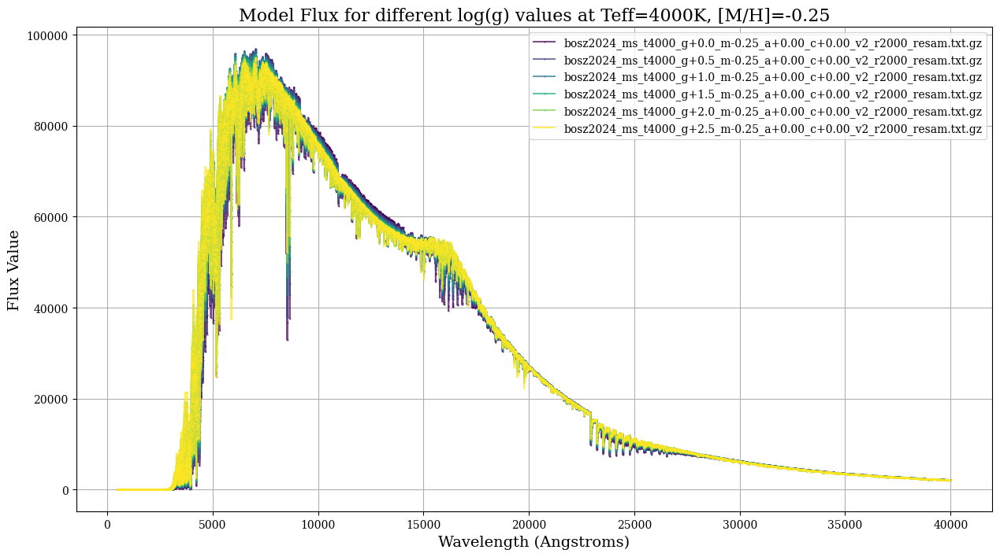

In [7]:
filenames_to_test = [
    '/Users/shannonbowes/Research/ysg/candidates_and_lcs/2022_asassn_lc_data/pysynphot_data/grid/bosz/r2000/m-0.75/bosz2024_ms_t7000_g+1.5_m-0.75_a+0.00_c+0.00_v2_r2000_resam.txt.gz',
    '/Users/shannonbowes/Research/ysg/candidates_and_lcs/2022_asassn_lc_data/pysynphot_data/grid/bosz/r2000/m-0.75/bosz2024_ms_t7000_g+2.0_m-0.75_a+0.00_c+0.00_v2_r2000_resam.txt.gz',
    '/Users/shannonbowes/Research/ysg/candidates_and_lcs/2022_asassn_lc_data/pysynphot_data/grid/bosz/r2000/m-0.75/bosz2024_ms_t7000_g+2.5_m-0.75_a+0.00_c+0.00_v2_r2000_resam.txt.gz']

filenames_to_test = [
    '/Users/shannonbowes/Research/ysg/candidates_and_lcs/2022_asassn_lc_data/pysynphot_data/grid/bosz/r2000/m-0.25/bosz2024_ms_t4000_g+0.0_m-0.25_a+0.00_c+0.00_v2_r2000_resam.txt.gz',
    '/Users/shannonbowes/Research/ysg/candidates_and_lcs/2022_asassn_lc_data/pysynphot_data/grid/bosz/r2000/m-0.25/bosz2024_ms_t4000_g+0.5_m-0.25_a+0.00_c+0.00_v2_r2000_resam.txt.gz',
    '/Users/shannonbowes/Research/ysg/candidates_and_lcs/2022_asassn_lc_data/pysynphot_data/grid/bosz/r2000/m-0.25/bosz2024_ms_t4000_g+1.0_m-0.25_a+0.00_c+0.00_v2_r2000_resam.txt.gz',
    '/Users/shannonbowes/Research/ysg/candidates_and_lcs/2022_asassn_lc_data/pysynphot_data/grid/bosz/r2000/m-0.25/bosz2024_ms_t4000_g+1.5_m-0.25_a+0.00_c+0.00_v2_r2000_resam.txt.gz',
    '/Users/shannonbowes/Research/ysg/candidates_and_lcs/2022_asassn_lc_data/pysynphot_data/grid/bosz/r2000/m-0.25/bosz2024_ms_t4000_g+2.0_m-0.25_a+0.00_c+0.00_v2_r2000_resam.txt.gz',
    '/Users/shannonbowes/Research/ysg/candidates_and_lcs/2022_asassn_lc_data/pysynphot_data/grid/bosz/r2000/m-0.25/bosz2024_ms_t4000_g+2.5_m-0.25_a+0.00_c+0.00_v2_r2000_resam.txt.gz']

fig = plt.figure(figsize=(15, 8))
colours = cm.viridis(np.linspace(0, 1, len(filenames_to_test)))
for model in filenames_to_test:
    data = np.loadtxt(model)  
    col0 = data[:, 0]
    col1 = data[:, 1]

    # Create mask for wavelengths <= 40000 Angstroms
    mask = wavelengths <= 40000

    # Apply mask to get filtered data
    wave_filtered = wavelengths[mask]
    flux_filtered = col0[mask]
    continuum_filtered = col1[mask]

    plt.plot(wave_filtered, flux_filtered, 'b.-', markersize=1, label=os.path.basename(model), color=colours[filenames_to_test.index(model)], alpha=0.7)
plt.title('Model Flux for different log(g) values at Teff=4000K, [M/H]=-0.25', fontsize=16)
plt.xlabel('Wavelength (Angstroms)', fontsize=14)
plt.ylabel('Flux Value', fontsize=14)
plt.legend()
plt.grid(True)

# Compute synthetic photometry

In [8]:
# Functions

def synth_flux(filter_name,model_lam,model_flux):
    '''
    Calculates the synthetic photometric flux for the input model with the
    input filter transmission file.

    Parameters:
    filter_name: The filter file containing the wavelength (Angstroms) 
                    and intensity (erg/s/cm^2/A)
    model_lam: The model wavelengths in Angstroms
    model_flux: The model flux in erg/s/cm^2/A

    Returns:
    flux: The synthetic flux in erg/s/cm^2/A
    '''
    filter_lam = filter_name.columns[0]
    filter_flux = filter_name.columns[1]
    
    f_lam=np.zeros(len(filter_lam))
    for i in range(len(f_lam)):
        # This interpolates the model flux along the same wavelengths as the
        # transmission curve. This needs to be done for the integration to work
        f_lam[i]=np.interp(filter_lam[i],model_lam,model_flux)
    
    # Multiply the (interpolated) model flux by the filter intensity, and integrate
    top = np.trapezoid(np.multiply(f_lam,filter_flux),x=filter_lam)
    # Integrate the filter intensity alone
    bottom = np.trapezoid(filter_flux,x=filter_lam)
    # Divide!
    flux = top/bottom
    
    return flux


def flux_to_mag(flux,zp):
    '''
    Converts a flux to a magnitude given the zero point.

    Parameters:
    flux: flux in erg/s/cm^2/A
    zp: Zero point in erg/s/cm^2/A

    Returns:
    mag: Magnitude
    '''

    mag = (-2.5)*np.log10(flux/zp)

    return mag

def synth_mag(filter_name,model_lam,model_flux,zp):
    '''
    Calculates the synthetic magnitude for the input model using the input
    filter transmission and a zero point.

    Parameters:
    filter_name: The filter file containing the wavelength (Angstroms) 
                    and intensity (erg/s/cm^2/A)
    model_lam: The model wavelengths in Angstroms
    model_flux: The model flux in erg/s/cm^2/A
    zp: Zero point in erg/s/cm^2/A

    Returns:
    mag: Magnitude
    '''

    flux = synth_flux(filter_name,model_lam,model_flux)
    mag = flux_to_mag(flux,zp)
    return mag

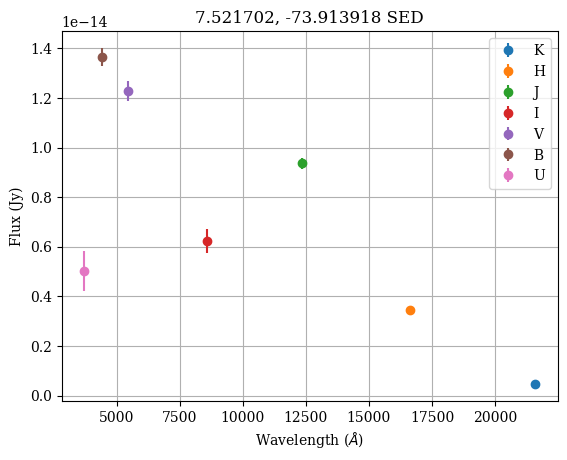

(array([21590.  , 16620.  , 12350.  ,  8568.89,  5438.23,  4394.48,
         3706.29]),
 array([4.83375636e-16, 3.43285490e-15, 9.36177381e-15, 6.23315469e-15,
        1.22788433e-14, 1.36506000e-14, 5.03785981e-15]),
 array([1.11297240e-17, 7.90414841e-17, 2.06932648e-16, 4.70740308e-16,
        4.07117328e-16, 3.64593875e-16, 8.02697317e-16]),
 array([12.349, 12.386, 12.694, 12.927, 13.68 , 14.145, 14.773]),
 array([0.025, 0.025, 0.024, 0.082, 0.036, 0.029, 0.173]),
 array(['K', 'H', 'J', 'I', 'V', 'B', 'U'], dtype='<U1'))

In [9]:
def observed_sed(index, flux=True, show=False):
    """ Plots the SED for a given index in the coords dataframe
    """
    RA = coords['RA'].iloc[index]
    dec = coords['DEC'].iloc[index]
    if index < 377:
        row = df_smc[(df_smc['ra'] == RA) & (df_smc['dec'] == dec)]
    else:
        row = df_lmc[(df_lmc['ra'] == RA) & (df_lmc['dec'] == dec)]
    if len(row) == 0:
        print("No matching row found in dataframe.")
        return
    # bands and their Vega zero points (in Jy)
    # band_zeropoints = {
    # # Near-infrared (2MASS)
    # 'Jmag': 1594.0,    # J-band
    # 'Hmag': 1024.0,    # H-band  
    # 'Kmag': 666.80,     # K-band
    # # Optical (Johnson-Cousins)
    # 'Umag': 1801.36,    # U-band
    # 'Bmag': 4019.91,    # B-band
    # 'Vmag': 3633.35,    # V-band
    # 'Imag': 2309.23,    # I-band
    # # UV (Swift UVOT)
    # 'uvw1_mag': 926.84,  # UVW1
    # 'uvw2_mag': 753.35,   # UVW2  
    # 'uvm2_mag': 786.13   # UVM2
    # }

    #bands and their Vega zero points in erg/s/cm^2/Angstrom
    band_zeropoints = {
    # Near-infrared (2MASS)
    'Jmag':1.11933e-9,    # J-band
    'Hmag':3.09069e-10,    # H-band
    'Kmag':4.20615e-11,     # K-band
    # Optical (Johnson-Cousins)
    'Umag':4.08739e-9,    # U-band
    'Bmag':6.21086e-9,    # B-band
    'Vmag':3.64047e-9,    # V-band
    'Imag':9.23651e-10,    # I-band
    # UV (Swift UVOT)
    'uvw1_mag':4.02204e-9,  # UVW
    'uvw2_mag':5.37469e-9,   # UVW2
    'uvm2_mag':4.66117e-9   # UVM2
    }
    
    # Effective wavelengths (in Angstroms)
    band_wavelengths = {
        'uvw2_mag': 2075.69,    # UV
        'uvm2_mag': 2246.56,    # UV
        'uvw1_mag': 2715.68,    # UV
        'Umag': 3706.29,        # U
        'Bmag': 4394.48,        # B
        'Vmag': 5438.23,        # V
        'Imag': 8568.89,        # I
        'Jmag': 12350.00,       # J
        'Hmag': 16620.00,       # H
        'Kmag': 21590.00        # K
    }
    df = row.iloc[0]
    wavelengths = []
    fluxes = []
    flux_errors = []
    mags = []
    mag_errors = []
    band_names = []
    
    for band in band_zeropoints.keys():
        if band in df.index and not pd.isna(df[band]):
            # Get magnitude and error
            mag = df[band]
            if band != 'uvm2_mag' and band != 'uvw1_mag' and band != 'uvw2_mag':
                error_col = f'e_{band}'
                band_names.append(band.replace('mag', ''))
            else:
                error_col = f'{band}_err'
                band_names.append(band.replace('_mag', ''))
            
            # FIX: Handle missing or invalid magnitude errors
            if error_col in df.index:
                mag_err = df[error_col]
            else:
                mag_err = None
            if mag_err is None or pd.isna(mag_err) or mag_err <= 0:
                print(f"WARNING: Missing or invalid error for {band} (error={mag_err}), using default 0.1")
                mag_err = 0.1  # Default error if missing, NaN, or zero/negative
            
            # Skip if magnitude itself is invalid
            if pd.isna(mag):
                print(f"WARNING: Invalid magnitude for {band}, skipping")
                continue
            
            # Convert magnitude to flux density (in Jy)
            # Flux = zeropoint * 10^(-0.4 * mag)
            flux_jy = band_zeropoints[band] * 10**(-0.4 * mag)
            # flux_mjy = flux_jy * 1000

            # Convert magnitude error to flux error: dF/F = 0.4 * ln(10) * dmag ≈ 0.921 * dmag
            flux_err_jy = flux_jy * 0.921 * mag_err
            # flux_err_mjy = flux_mjy * 0.921 * mag_err
            
            wavelengths.append(band_wavelengths[band])
            fluxes.append(flux_jy)
            flux_errors.append(flux_err_jy)
            mags.append(mag)
            mag_errors.append(mag_err)
            # band_names.append(band.replace('mag', ''))
    
    # Sort by longest to shortest wavelength:
    sorted_indices = np.argsort(wavelengths)[::-1]
    wavelengths = np.array(wavelengths)[sorted_indices]
    fluxes = np.array(fluxes)[sorted_indices]
    flux_errors = np.array(flux_errors)[sorted_indices]
    mags = np.array(mags)[sorted_indices]
    mag_errors = np.array(mag_errors)[sorted_indices]
    band_names = np.array(band_names)[sorted_indices]

    if show:
        fig = plt.figure()
        # plt.scatter(wavelengths, fluxes, color='blue')
        # plt.errorbar(wavelengths, fluxes, yerr=flux_errors, fmt='o', color='blue', label='Flux')
        for i in range(len(wavelengths)):
            # plt.errorbar(wavelengths[i], fluxes[i], yerr=flux_errors[i], fmt='o', label=band_names[i])
            if flux:
                plt.errorbar(wavelengths[i], fluxes[i], yerr=flux_errors[i], fmt='o', label=band_names[i])
            else:
                plt.errorbar(wavelengths[i], mags[i], yerr=mag_errors[i], fmt='o', label=band_names[i])
        plt.xlabel('Wavelength ($\\AA$)')
        if flux:
            plt.ylabel('Flux (Jy)')
            # plt.yscale('log')
        else:
            plt.ylabel('Magnitudes')
            plt.gca().invert_yaxis()
        plt.title(f'{RA}, {dec} SED')
        plt.legend()
        plt.grid()
        plt.show()

    return wavelengths, fluxes, flux_errors, mags, mag_errors, band_names

observed_sed(0, flux=True, show=True)

In [10]:
# Load in filter functions
col_names=['lam','flux']

tmass_j = ascii.read('./pysynphot_data/grid/bosz/2MASS_2MASS.J_v3.0596e-10_ab7.08741e-10_eff12350.dat',
                    names=col_names, data_start=0)
tmass_h = ascii.read('./pysynphot_data/grid/bosz/2MASS_2MASS.H_v1.11064e-10_ab4.00078e-10_eff16620.dat',
                    names=col_names, data_start=0)
tmass_k = ascii.read('./pysynphot_data/grid/bosz/2MASS_2MASS.Ks_v4.17999e-11_ab2.32482e-10_eff21590.dat',
                    names=col_names, data_start=0)

mcps_U=ascii.read('./pysynphot_data/grid/bosz/Misc_MCPS.U_v4.08739e-9_ab8.23894e-9_eff3706.dat',
                   names=col_names,data_start=0)
mcps_B=ascii.read('./pysynphot_data/grid/bosz/Misc_MCPS.B_v6.21086e-9_ab5.60999e-9_eff4394.dat',
                   names=col_names,data_start=0)
mcps_V=ascii.read('./pysynphot_data/grid/bosz/Misc_MCPS.V_v3.64047e-9_ab3.63812e-9_eff5438.dat',
                   names=col_names,data_start=0)
mcps_I=ascii.read('./pysynphot_data/grid/bosz/Misc_MCPS.I_v9.23651e-10_ab1.45234e-9_eff8568.dat',
                   names=col_names,data_start=0)

swift_uvm1=ascii.read('./pysynphot_data/grid/bosz/Swift_UVOT.UVM2_trn_v4.66117e-9_ab2.15291e-8_eff2246.dat',
                   names=col_names,data_start=0)
swift_uvw1=ascii.read('./pysynphot_data/grid/bosz/Swift_UVOT.UVW1_trn_v4.02204e-9_ab1.57569e-8_eff2715.dat',
                   names=col_names,data_start=0)
swift_uvw2=ascii.read('./pysynphot_data/grid/bosz/Swift_UVOT.UVW2_trn_v5.37469e-9_2.59051e-8_eff2075.dat',
                   names=col_names,data_start=0)    


# Vega zero points
tmass_j_zp = 3.129e-10
tmass_h_zp = 1.133e-10
tmass_k_zp = 4.283e-11
mcps_U_zp = 4.08739e-9
mcps_B_zp = 6.21086e-9
mcps_V_zp = 3.64047e-9
mcps_I_zp = 9.23651e-10
swift_uvm1_zp = 4.66117e-9
swift_uvw1_zp = 4.02204e-9
swift_uvw2_zp = 5.37469e-9

# Band wavelengths for plotting
band_wavelengths = {
    'J': 12350.0,       # 2MASS J
    'H': 16620.0,       # 2MASS H  
    'K': 21590.0,       # 2MASS K
    'U': 3706.29,       # MCPS U
    'B': 4394.48,       # MCPS B
    'V': 5438.23,       # MCPS V
    'I': 8568.89,       # MCPS I
    'uvm2': 2246.56,    # Swift UVM2
    'uvw1': 2715.68,    # Swift UVW1
    'uvw2': 2075.69     # Swift UVW2
}

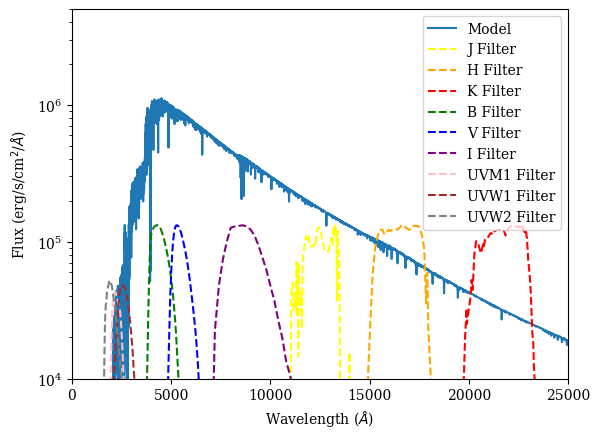

In [11]:
# Load in example spectrum
wave=ascii.read('./pysynphot_data/grid/bosz/r2000/bosz2024_wave_r2000.txt',
                   names=['wave'],data_start=0)
ex_flux=ascii.read('./pysynphot_data/grid/bosz/r2000/m-0.25/bosz2024_ms_t6000_g+1.0_m-0.25_a+0.00_c+0.00_v2_r2000_resam.txt.gz',
                   names=['flux','cont'],data_start=0)
# print(np.min(ex_wave), np.max(ex_wave))

plt.plot(wave['wave'],ex_flux['flux'],
         '-',c='C0',label='Model')
plt.plot(tmass_j['lam'],tmass_j['flux']*np.mean(ex_flux['flux']),
         '--',c='yellow',label='J Filter')
plt.plot(tmass_h['lam'],tmass_h['flux']*np.mean(ex_flux['flux']),
         '--',c='orange',label='H Filter')
plt.plot(tmass_k['lam'],tmass_k['flux']*np.mean(ex_flux['flux']),
         '--',c='red',label='K Filter')
plt.plot(mcps_B['lam'],mcps_B['flux']*np.mean(ex_flux['flux']),
         '--',c='green',label='B Filter')
plt.plot(mcps_V['lam'],mcps_V['flux']*np.mean(ex_flux['flux']),
         '--',c='blue',label='V Filter')
plt.plot(mcps_I['lam'],mcps_I['flux']*np.mean(ex_flux['flux']),
         '--',c='purple',label='I Filter')
plt.plot(swift_uvm1['lam'],swift_uvm1['flux']*np.mean(ex_flux['flux']),
         '--',c='pink',label='UVM1 Filter')
plt.plot(swift_uvw1['lam'],swift_uvw1['flux']*np.mean(ex_flux['flux']),
         '--',c='brown',label='UVW1 Filter')
plt.plot(swift_uvw2['lam'],swift_uvw2['flux']*np.mean(ex_flux['flux']),
         '--',c='gray',label='UVW2 Filter')

plt.yscale('log')
plt.xlim(0,25000)
plt.ylim(1e4,5e6)
plt.xlabel(r'Wavelength ($\AA$)')
plt.ylabel(r'Flux (erg/s/cm$^2$/$\AA$)')
plt.legend()

In [12]:
# Calculate synthetic photometry for your 3 magnitudes
def compute_synth_photometry(ex_wave, ex_flux):
    jmag=synth_mag(tmass_j,ex_wave['wave'],ex_flux['flux'],tmass_j_zp)
    hmag=synth_mag(tmass_h,ex_wave['wave'],ex_flux['flux'],tmass_h_zp)
    kmag=synth_mag(tmass_k,ex_wave['wave'],ex_flux['flux'],tmass_k_zp)
    Umag=synth_mag(mcps_U,ex_wave['wave'],ex_flux['flux'],mcps_U_zp)
    Bmag=synth_mag(mcps_B,ex_wave['wave'],ex_flux['flux'],mcps_B_zp)
    Vmag=synth_mag(mcps_V,ex_wave['wave'],ex_flux['flux'],mcps_V_zp)
    Imag=synth_mag(mcps_I,ex_wave['wave'],ex_flux['flux'],mcps_I_zp)
    uvm2_mag=synth_mag(swift_uvm1,ex_wave['wave'],ex_flux['flux'],swift_uvm1_zp)
    uvw1_mag=synth_mag(swift_uvw1,ex_wave['wave'],ex_flux['flux'],swift_uvw1_zp)
    uvw2_mag=synth_mag(swift_uvw2,ex_wave['wave'],ex_flux['flux'],swift_uvw2_zp)
    model_mags=[jmag,hmag,kmag,Umag,Bmag,Vmag,Imag,uvm2_mag,uvw1_mag,uvw2_mag]

    #convert them to flux:
    jflux = tmass_j_zp * 10**(-0.4 * jmag)
    hflux = tmass_h_zp * 10**(-0.4 * hmag)
    kflux = tmass_k_zp * 10**(-0.4 * kmag)
    Uflux = mcps_U_zp * 10**(-0.4 * Umag)
    Bflux = mcps_B_zp * 10**(-0.4 * Bmag)
    Vflux = mcps_V_zp * 10**(-0.4 * Vmag)
    Iflux = mcps_I_zp * 10**(-0.4 * Imag)
    uvm2_flux = swift_uvm1_zp * 10**(-0.4 * uvm2_mag)
    uvw1_flux = swift_uvw1_zp * 10**(-0.4 * uvw1_mag)
    uvw2_flux = swift_uvw2_zp * 10**(-0.4 * uvw2_mag)
    model_fluxes=[jflux,hflux,kflux,Uflux,Bflux,Vflux,Iflux,uvm2_flux,uvw1_flux,uvw2_flux]

    # dictionary with band names as keys
    synth_phot = {
        'J': {'mag': jmag, 'flux': jflux},
        'H': {'mag': hmag, 'flux': hflux},
        'K': {'mag': kmag, 'flux': kflux},
        'U': {'mag': Umag, 'flux': Uflux},
        'B': {'mag': Bmag, 'flux': Bflux},
        'V': {'mag': Vmag, 'flux': Vflux},
        'I': {'mag': Imag, 'flux': Iflux},
        'uvm2': {'mag': uvm2_mag, 'flux': uvm2_flux},
        'uvw1': {'mag': uvw1_mag, 'flux': uvw1_flux},
        'uvw2': {'mag': uvw2_mag, 'flux': uvw2_flux}
    }

    return synth_phot

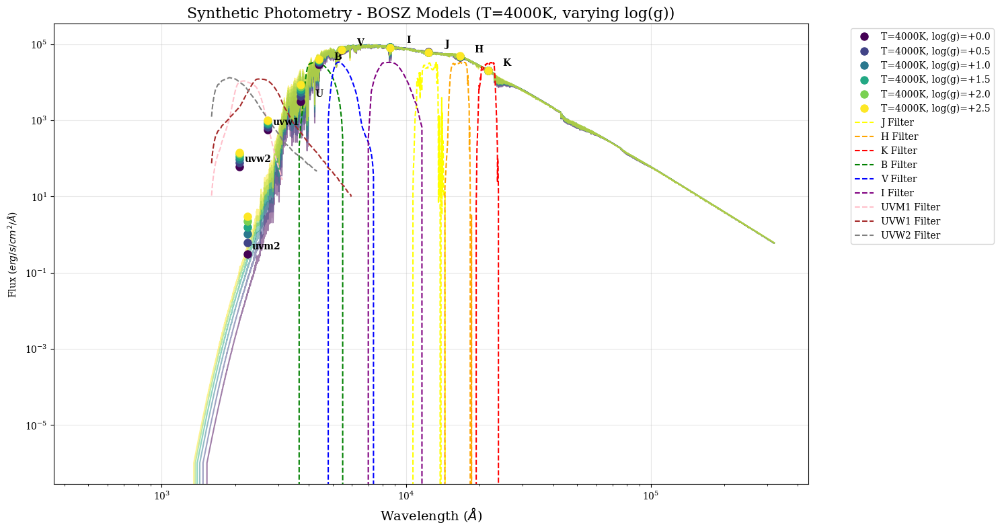

In [13]:
# filenames_to_test = [
#     '/Users/shannonbowes/Research/ysg/candidates_and_lcs/2022_asassn_lc_data/pysynphot_data/grid/bosz/r2000/m-0.75/bosz2024_ms_t7000_g+1.5_m-0.75_a+0.00_c+0.00_v2_r2000_resam.txt.gz',
#     '/Users/shannonbowes/Research/ysg/candidates_and_lcs/2022_asassn_lc_data/pysynphot_data/grid/bosz/r2000/m-0.75/bosz2024_ms_t7000_g+2.0_m-0.75_a+0.00_c+0.00_v2_r2000_resam.txt.gz',
#     '/Users/shannonbowes/Research/ysg/candidates_and_lcs/2022_asassn_lc_data/pysynphot_data/grid/bosz/r2000/m-0.75/bosz2024_ms_t7000_g+2.5_m-0.75_a+0.00_c+0.00_v2_r2000_resam.txt.gz']

filenames_to_test = [
    '/Users/shannonbowes/Research/ysg/candidates_and_lcs/2022_asassn_lc_data/pysynphot_data/grid/bosz/r2000/m-0.25/bosz2024_ms_t4000_g+0.0_m-0.25_a+0.00_c+0.00_v2_r2000_resam.txt.gz',
    '/Users/shannonbowes/Research/ysg/candidates_and_lcs/2022_asassn_lc_data/pysynphot_data/grid/bosz/r2000/m-0.25/bosz2024_ms_t4000_g+0.5_m-0.25_a+0.00_c+0.00_v2_r2000_resam.txt.gz',
    '/Users/shannonbowes/Research/ysg/candidates_and_lcs/2022_asassn_lc_data/pysynphot_data/grid/bosz/r2000/m-0.25/bosz2024_ms_t4000_g+1.0_m-0.25_a+0.00_c+0.00_v2_r2000_resam.txt.gz',
    '/Users/shannonbowes/Research/ysg/candidates_and_lcs/2022_asassn_lc_data/pysynphot_data/grid/bosz/r2000/m-0.25/bosz2024_ms_t4000_g+1.5_m-0.25_a+0.00_c+0.00_v2_r2000_resam.txt.gz',
    '/Users/shannonbowes/Research/ysg/candidates_and_lcs/2022_asassn_lc_data/pysynphot_data/grid/bosz/r2000/m-0.25/bosz2024_ms_t4000_g+2.0_m-0.25_a+0.00_c+0.00_v2_r2000_resam.txt.gz',
    '/Users/shannonbowes/Research/ysg/candidates_and_lcs/2022_asassn_lc_data/pysynphot_data/grid/bosz/r2000/m-0.25/bosz2024_ms_t4000_g+2.5_m-0.25_a+0.00_c+0.00_v2_r2000_resam.txt.gz']

# Define the correct order and names to match compute_synth_photometry output
synth_band_names = ['J', 'H', 'K', 'U', 'B', 'V', 'I', 'uvm2', 'uvw1', 'uvw2']
synth_wavelengths = [band_wavelengths[band] for band in synth_band_names]

fig, ax = plt.subplots(figsize=(15, 8))
colors = plt.cm.viridis(np.linspace(0, 1, len(filenames_to_test)))

# Store first model's magnitudes for band labeling
first_model_mags = None
first_model_flux = None

for i, model in enumerate(filenames_to_test):
    data = np.loadtxt(model)
    # Create a dictionary-like structure that the function expects
    flux_data = {'flux': data[:,0]}
    synth_phot = compute_synth_photometry(wave, flux_data) 
    points_mag = [synth_phot[band]['mag'] for band in synth_band_names]
    points_flux = [synth_phot[band]['flux'] for band in synth_band_names]
    
    # Store first model's magnitudes for consistent band labeling
    if i == 0:
        first_model_mags = points_mag
        first_model_flux = points_flux
    
    # Parse model parameters from filename for label
    import re
    match = re.search(r't(\d+)_g([+-]?\d+\.?\d*)', os.path.basename(model))
    if match:
        teff = match.group(1)
        logg = match.group(2)
        model_label = f'T={teff}K, log(g)={logg}'
    else:
        model_label = os.path.basename(model)
   # Scale the flux to be comparable to the magnitude range
    ax.plot(wave['wave'], flux_data['flux'], color=colors[i], alpha=0.5) 
    # Plot with correct wavelength-magnitude pairs
#     ax.plot(synth_wavelengths, points_mag, 'o', color=colors[i], 
#             label=model_label, markersize=8, linewidth=2, alpha=0.8)
    ax.plot(synth_wavelengths, points_flux, 'o', color=colors[i], 
            label=model_label, markersize=8, linewidth=2, zorder = 10)

ax.plot(tmass_j['lam'],tmass_j['flux']*np.mean(points_flux),
        '--',c='yellow',label='J Filter')
ax.plot(tmass_h['lam'],tmass_h['flux']*np.mean(points_flux),
        '--',c='orange',label='H Filter')
ax.plot(tmass_k['lam'],tmass_k['flux']*np.mean(points_flux),
        '--',c='red',label='K Filter')
ax.plot(mcps_B['lam'],mcps_B['flux']*np.mean(points_flux),
        '--',c='green',label='B Filter')
ax.plot(mcps_V['lam'],mcps_V['flux']*np.mean(points_flux),
        '--',c='blue',label='V Filter')
ax.plot(mcps_I['lam'],mcps_I['flux']*np.mean(points_flux),
        '--',c='purple',label='I Filter')
ax.plot(swift_uvm1['lam'],swift_uvm1['flux']*np.mean(points_flux),
        '--',c='pink',label='UVM1 Filter')
ax.plot(swift_uvw1['lam'],swift_uvw1['flux']*np.mean(points_flux),
        '--',c='brown',label='UVW1 Filter')
ax.plot(swift_uvw2['lam'],swift_uvw2['flux']*np.mean(points_flux),
        '--',c='gray',label='UVW2 Filter')

# Add band name labels only once, using the first model's positions
for j, (wl, mag, band) in enumerate(zip(synth_wavelengths, first_model_mags, synth_band_names)):
    ax.annotate(band, (wl, mag), xytext=(20, 5), textcoords='offset points', 
               fontsize=10, ha='center', fontweight='bold')
for j, (wl, mag, band) in enumerate(zip(synth_wavelengths, first_model_flux, synth_band_names)):
    ax.annotate(band, (wl, mag), xytext=(20, 5), textcoords='offset points', 
               fontsize=10, ha='center', fontweight='bold')

ax.set_xlabel('Wavelength ($\\AA$)', fontsize=14)
# ax.set_ylabel('Magnitude', fontsize=14)
ax.set_ylabel('Flux ($erg/s/cm^2/\\AA$)')
# ax.set_xlim(0,40000)
# ax.set_ylim(1e-1,1e7)
ax.set_yscale('log')
ax.set_xscale('log')
ax.set_title('Synthetic Photometry - BOSZ Models (T=4000K, varying log(g))', fontsize=16)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
ax.grid(True, alpha=0.3)
# ax.invert_yaxis()  # Invert y-axis since smaller magnitudes are brighter
plt.tight_layout()
plt.show()

In [14]:
# Functions
def rchi2_with_err(star_mags,star_err,model_mags):
    '''
    Returns the reduced chi^2, accounting for errors
    Parameters:
        star_mags: Observed magnitudes
        star_err: Uncertainty on the observed magnitudes
        model_mags: Model magnitudes
    Returns:
        rchi2: Reduced chi^2 value
    '''
    N = len(star_mags)
    z = (star_mags-model_mags)/star_err
    rchi2 = np.sum(z**2)/(N-1)
    return rchi2

In [15]:
def Cardelli_redden(wave,flux,Av=0,Rv=3.1):
    '''Will redden an input spectrum based on the Cardelli law:
    
    Parameters:
    wave (angstrom): wavelengths of input spectrum in Angstrom
    flux (erg/s/cm/Ang): flux of spectrum; scaled version of this flux are fine.
    Av:
    Rv:
    
    Returns: a new flux array in same units as input
    '''

    wave_micon=wave*1.0e-4
    wave_inverse=1.0/wave_micon
    
    A_lambda=np.zeros(len(wave))
    ax=np.zeros(len(wave))
    bx=np.zeros(len(wave))
    
    for i in range(len(wave)):
        if((wave_inverse[i] > 0.3) and (wave_inverse[i] < 1.1)):
            ax[i]=0.574*wave_inverse[i]**1.61
            bx[i]=-0.527*wave_inverse[i]**1.61
        if((wave_inverse[i] > 1.1) and (wave_inverse[i] < 3.3)):
            y=wave_inverse[i] - 1.82
            ax[i]=1+ 0.17699*y - 0.50447*y**2. - 0.02427*y**3.+0.72085*y**4.+0.01979*y**5.-0.77530*y**6.+0.32999*y**7.
            bx[i]=1.41338*y+2.28305*y**2.+1.07233*y**3.-5.38434*y**4.-0.62251*y**5.+5.30260*y**6.-2.09002*y**7.
        if((wave_inverse[i] > 3.3) and (wave_inverse[i] < 8.0)):
            if(wave_inverse[i] > 5.9):
                Fa=-0.04473*(wave_inverse[i] - 5.9)**2.-0.009779*(wave_inverse[i]-5.9)**3.
                Fb=0.2130*(wave_inverse[i] - 5.9)**2. +0.1207*(wave_inverse[i] -5.9)**3.
            else:
                Fa = 0.0
                Fb = 0.0

            ax[i]=1.752 - 0.316*wave_inverse[i]-0.104/((wave_inverse[i]-4.67)**2.+0.341) +Fa
            bx[i]=-3.090+1.825*wave_inverse[i]+1.206/((wave_inverse[i] - 4.62)**2.+0.263) +Fb

    A_lambda=(ax+bx/Rv)*Av
    #print(A_lambda)
    NewSpec=flux*10.**(-0.4*A_lambda)
    results = NewSpec
    return results

# temperature loop for a single star

/var/folders/34/3847lqd14j78mfm70_z1c_r00000gn/T/ipykernel_4062/3677652267.py:141: RuntimeWarning: divide by zero encountered in log10
  plt.plot(wave['wave'], -2.5 * np.log10(newflux/tmass_k_zp), #+ plot_mag_shift,


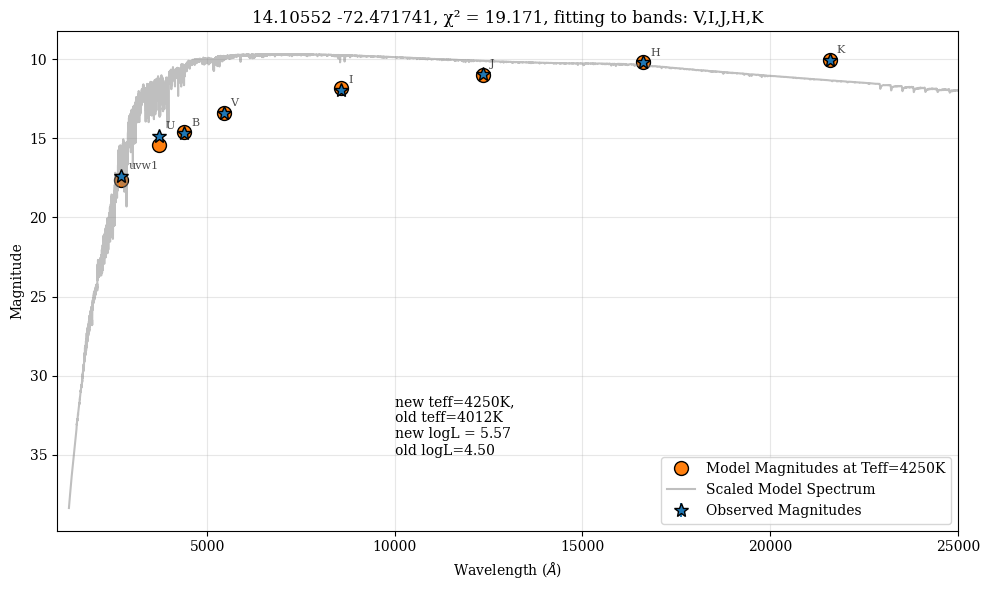

In [16]:
def fit_models_to_star(star_idx, max_models=None, show=False):   
    computed_models = pd.read_csv('synth_phot_all_models.csv')
    model_band_names = ['J', 'H', 'K', 'U', 'B', 'V', 'I', 'uvm2', 'uvw1', 'uvw2']
    synth_band_names = ['J', 'H', 'K', 'U', 'B', 'V', 'I', 'uvm2', 'uvw1', 'uvw2']          
    chi2_results = []
    old_teff = 10**stats['logT'][star_idx]
    old_logl = stats['logL'][star_idx]

    obs = observed_sed(star_idx, show=False)
    obs_wavelengths, obs_fluxes, obs_flux_errors, obs_mags, obs_mag_errors, obs_band_names = obs
    
    # Create dictionaries for observed data keyed by band name
    obs_mags_dict = dict(zip(obs_band_names, obs_mags))
    obs_errors_dict = dict(zip(obs_band_names, obs_mag_errors))
    
    # Find common bands between observations and model
    common_bands = [band for band in obs_band_names if band in synth_band_names]
    
    # Extract matched data arrays using band names
    matched_obs_mags = np.array([obs_mags_dict[band] for band in common_bands])
    matched_obs_errors = np.array([obs_errors_dict[band] for band in common_bands])
    
    # Define cut bands for reduced chi-squared calculation
    cut_bands = ['J', 'H', 'K', 'V', 'I']
    
    # Test only bosz_smc for star_idx < 377, only lmc_bosz for star_idx >= 377:
    if star_idx < 377:
        models_to_test = computed_models[computed_models['metallicity'] == -0.75]
    else:
        models_to_test = computed_models[computed_models['metallicity'] == -0.25]

    for i, model in models_to_test.iterrows():
        matched_model_mags = np.array([model[band+'_mag'] for band in common_bands])
        
        # Determine reference band for magnitude shift (prefer K, then H, then first available)
        if 'K' in common_bands:
            ref_band = 'K'
        elif 'H' in common_bands:
            ref_band = 'H'
        else:
            ref_band = common_bands[0]
        
        ref_idx = common_bands.index(ref_band)
        mag_shift = matched_obs_mags[ref_idx] - matched_model_mags[ref_idx]
        model_mags_shifted = matched_model_mags + mag_shift


        offset = 10**(-0.4 * matched_obs_mags[ref_idx]) / 10**(-0.4 * matched_model_mags[ref_idx])
        luminosity = model['lum_unscaled'] * offset
        logL = np.log10(luminosity / 3.826e33)  # Solar luminosity in erg/s
        
        # Calculate chi-squared for full set
        chi2_full = rchi2_with_err(matched_obs_mags, matched_obs_errors, model_mags_shifted)
        
        # Calculate chi-squared for cut bands (J, H, K, V, I only)
        cut_indices = [j for j, band in enumerate(common_bands) if band in cut_bands]
        chi2_cut = np.nan
        if len(cut_indices) > 0:
            chi2_cut = rchi2_with_err(matched_obs_mags[cut_indices], 
                                    matched_obs_errors[cut_indices], 
                                    model_mags_shifted[cut_indices])
        
        chi2_results.append({
            'teff': model['teff'],
            'logT': np.log10(model['teff']),
            'logg': model['logg'],
            'av': model['av'],
            'metallicity': model['metallicity'],
            'chi2_full': chi2_full,
            'chi2_cut': chi2_cut,
            'n_bands': len(common_bands),
            'ref_band': ref_band,
            'mag_shift': mag_shift,
            'offset': offset,
            'luminosity': luminosity,
            'logL': logL,
            'filepath': model['model']
        })
    chi2_results_full = sorted(chi2_results, key=lambda x: x['chi2_full'])
    chi2_results_cut = sorted(chi2_results, key=lambda x: x['chi2_cut'] if not np.isnan(x['chi2_cut']) else float('inf'))
    if show:
        # Plot best fit
        best_model = chi2_results_cut[0]
        # Load best model spectrum
        best_model_spectrum = ascii.read(best_model['filepath'], names=['flux','cont'], data_start=0)
        best_model_flux = Cardelli_redden(wave['wave'], best_model_spectrum['flux'], Av=best_model['av'])
        # Calculate synthetic photometry for all bands using the best model
        best_model_mags_calc = [
            synth_mag(tmass_j, wave['wave'], best_model_flux, tmass_j_zp),      # J
            synth_mag(tmass_h, wave['wave'], best_model_flux, tmass_h_zp),      # H  
            synth_mag(tmass_k, wave['wave'], best_model_flux, tmass_k_zp),      # K
            synth_mag(mcps_U, wave['wave'], best_model_flux, mcps_U_zp),        # U
            synth_mag(mcps_B, wave['wave'], best_model_flux, mcps_B_zp),        # B
            synth_mag(mcps_V, wave['wave'], best_model_flux, mcps_V_zp),        # V
            synth_mag(mcps_I, wave['wave'], best_model_flux, mcps_I_zp),        # I
            synth_mag(swift_uvm1, wave['wave'], best_model_flux, swift_uvm1_zp), # uvm2
            synth_mag(swift_uvw1, wave['wave'], best_model_flux, swift_uvw1_zp), # uvw1
            synth_mag(swift_uvw2, wave['wave'], best_model_flux, swift_uvw2_zp)  # uvw2
        ]
        # Create model magnitudes dictionary for best model
        best_model_mags_dict = dict(zip(model_band_names, best_model_mags_calc))
        # Find common bands between observations and best model (use consistent logic)
        best_common_bands = [band for band in obs_band_names if band in best_model_mags_dict]
        # Extract matched data arrays using band names - consistent with main loop
        plot_matched_obs_mags = np.array([obs_mags_dict[band] for band in best_common_bands])
        plot_matched_obs_errors = np.array([obs_errors_dict[band] for band in best_common_bands])  
        plot_matched_model_mags = np.array([best_model_mags_dict[band] for band in best_common_bands])
        # Determine reference band for magnitude shift (consistent with main loop)
        if 'K' in best_common_bands:
            plot_ref_band = 'K'
        elif 'H' in best_common_bands:
            plot_ref_band = 'H' 
        else:
            plot_ref_band = best_common_bands[0]
            
        plot_ref_idx = best_common_bands.index(plot_ref_band)
        plot_mag_shift = plot_matched_obs_mags[plot_ref_idx] - plot_matched_model_mags[plot_ref_idx]
        plot_model_mags_shifted = plot_matched_model_mags + plot_mag_shift
        plot_matched_wavelengths = [band_wavelengths[band] for band in best_common_bands]

        offset = 10**(-0.4 * matched_obs_mags[ref_idx]) / 10**(-0.4 * matched_model_mags[ref_idx])
        newflux = best_model_flux * offset
        luminosity = model['lum_unscaled'] * offset
        logL = np.log10(luminosity / 3.826e33)  # Solar luminosity in erg/s


        

        # Calculate chi-squared for the plot title
        plot_chi2 = rchi2_with_err(plot_matched_obs_mags, plot_matched_obs_errors, plot_model_mags_shifted)
        fig = plt.figure(figsize=(10, 6))
        plt.errorbar(obs_wavelengths, obs_mags, yerr=obs_mag_errors,
                    ms=10, fmt='*', mec='k', mfc='C0', ecolor='C0', label='Observed Magnitudes')
        plt.plot(plot_matched_wavelengths, plot_model_mags_shifted,
                'o', ms=10, mec='k', mfc='C1', label='Model Magnitudes at Teff={:.0f}K'.format(best_model['teff']))
        # Add band labels using consistent variables
        for i, (wl, mag, band) in enumerate(zip(plot_matched_wavelengths, plot_matched_obs_mags, best_common_bands)):
            plt.annotate(band, (wl, mag), xytext=(5, 5), textcoords='offset points', 
                        fontsize=8, alpha=0.7)
            
        plt.plot(wave['wave'], -2.5 * np.log10(newflux/tmass_k_zp), #+ plot_mag_shift,
                 '-', color='gray', alpha=0.5, label='Scaled Model Spectrum')

        plt.annotate('new teff={:.0f}K, \nold teff={:.0f}K \nnew logL = {:.2f} \nold logL={:.2f}'.format(best_model['teff'], old_teff, logL, old_logl), xy=(10000,35), color='black')
        plt.xlabel(r'Wavelength ($\AA$)')
        plt.ylabel('Magnitude')
        RA = coords['RA'].iloc[star_idx]
        dec = coords['DEC'].iloc[star_idx]
        plt.title(f'{RA} {dec}, χ² = {plot_chi2:.3f}, fitting to bands: V,I,J,H,K')
        plt.gca().invert_yaxis()
        plt.xlim(1000,25000)
        plt.legend(loc='best')
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()
    
fit_models_to_star(star_idx=222, show=True)

# loop for all models, and for all YSGs:

In [17]:
def synth_phot_all_models(output_filename='synth_phot_all_models.csv', batch_size=1000):
    """
    Generate synthetic photometry for all BOSZ models across different reddening values.
    
    Parameters:
    output_filename: str, filename for the output CSV file
    batch_size: int, number of rows to accumulate before writing to file
    
    Returns:
    str: path to the output file
    """
    synth_band_names = ['J', 'H', 'K', 'U', 'B', 'V', 'I', 'uvm2', 'uvw1', 'uvw2']
    reddening = [0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0]
    d_smc = 62.44 * 1e3 * 3.086e18
    d_lmc = 49.59 * 1e3 * 3.086e18
    
    headers = ['model', 'teff', 'logg', 'atmos', 'metallicity', 'av', 'lum_unscaled']
    # Add magnitude columns
    headers.extend([f'{band}_mag' for band in synth_band_names])
    # Add flux columns  
    headers.extend([f'{band}_flux' for band in synth_band_names])
    
    # Calculate total iterations for progress bar
    total_iterations = 0
    for metallicity_group in [smc_bosz, lmc_bosz]:
        total_iterations += len(metallicity_group) * len(reddening)
    
    print(f"Processing {total_iterations} model-reddening combinations...")
    print(f"Writing to: {output_filename}")
    
    # Initialize batch storage
    batch_data = []
    rows_written = 0
    
    with open(output_filename, 'w', newline='') as csvfile:
        writer = csv.writer(csvfile)
        writer.writerow(headers)  # write header
        
        # Progress bar for all iterations
        pbar = tqdm(total=total_iterations, desc="Computing synthetic photometry")

        try:
            for metallicity_group in [smc_bosz, lmc_bosz]:
                for model_file in metallicity_group:
                    model = model_file['filepath']
                    model_teff = model_file['teff']
                    model_logg = model_file['logg']
                    atmos = model_file['class']
                    metallicity = model_file['metallicity']
                    
                    # Load model spectrum once per model
                    try:
                        model_flux = ascii.read(model, names=['flux','cont'], data_start=0)
                    except Exception as e:
                        print(f"\\nError reading model {model}: {e}")
                        pbar.update(len(reddening))  # Skip all reddening values for this model
                        return
                    
                    for av in reddening:
                        try:
                            # Apply reddening
                            reddened_model_flux = Cardelli_redden(wave['wave'], model_flux['flux'], Av=av)
                            
                            # Create a flux dict that matches compute_synth_photometry interface
                            flux_data = {'flux': reddened_model_flux}
                            if metallicity_group == smc_bosz:
                                lum_unscaled = 4 * np.pi * d_smc**2 * np.trapezoid(flux_data['flux'], wave['wave'])
                            else:
                                lum_unscaled = 4 * np.pi * d_lmc**2 * np.trapezoid(flux_data['flux'], wave['wave'])
                            
                            # Compute synthetic photometry
                            synth_phot = compute_synth_photometry(wave, flux_data)
                            
                            # Extract magnitudes and fluxes in the correct order
                            points_mag = [synth_phot[band]['mag'] for band in synth_band_names]
                            points_flux = [synth_phot[band]['flux'] for band in synth_band_names]
                            
                            # Create row data
                            row_data = [
                                model,           # model filepath
                                model_teff,      # model_teff  
                                model_logg,      # model_logg
                                atmos,           # atmos
                                metallicity,     # metallicity
                                av,               # av
                                lum_unscaled
                            ]
                            row_data.extend(points_mag)   # Add magnitude columns
                            row_data.extend(points_flux)  # Add flux columns
                            
                            batch_data.append(row_data)
                            
                            # Write batch if it reaches batch_size
                            if len(batch_data) >= batch_size:
                                writer.writerows(batch_data)
                                csvfile.flush()  # Ensure data is written to disk
                                rows_written += len(batch_data)
                                pbar.set_postfix(rows_written=rows_written)
                                batch_data = []  # Reset batch
                                
                        except Exception as e:
                            print(f"\\nError processing model {model} with Av={av}: {e}")
                        
                        pbar.update(1)
            
            # Write remaining batch data
            if batch_data:
                writer.writerows(batch_data)
                rows_written += len(batch_data)
                
        except KeyboardInterrupt:
            print(f"\\nComputation interrupted. Partial results saved ({rows_written} rows)")
        finally:
            pbar.close()
    
    print(f"\\nCompleted! Total rows written: {rows_written}")
    print(f"Output saved to: {output_filename}")
    
    return output_filename

synth_phot_all_models(output_filename='synth_phot_all_models.csv', batch_size=1000)

Processing 5082 model-reddening combinations...
Writing to: synth_phot_all_models.csv


Computing synthetic photometry: 100%|██████████| 5082/5082 [02:22<00:00, 35.60it/s, rows_written=5000]


\nCompleted! Total rows written: 5082
Output saved to: synth_phot_all_models.csv


'synth_phot_all_models.csv'

In [ ]:
def compute_ysgs(star_indices, batch_size=10):
    """
    Compute stellar parameter fits for YSG candidates and save results in batches.
    
    Parameters:
    star_indices: list or range of star indices to process (default: 0-377 for all)
    batch_size: int, number of stars to process before writing to file
    """
    
    computed_models = pd.read_csv('synth_phot_all_models.csv')
    standard_band_order = ['J', 'H', 'K', 'U', 'B', 'V', 'I', 'uvm2', 'uvw1', 'uvw2']  # Standard photometric order
    # Define cut bands for reduced chi-squared calculation
    cut_bands = ['J', 'H', 'K', 'V', 'I']  # Match standard_band_order
    
    star_indices = range(star_indices)
    
    print(f"Processing {len(star_indices)} stars...")
    
    # Process each star with progress bar
    for star_idx in tqdm(star_indices, desc="Fitting stars"):
        RA = coords['RA'].iloc[star_idx]
        dec = coords['DEC'].iloc[star_idx]
        output_filename = f'temp_fitting/{RA}_{dec}.csv'
        print(f"\nProcessing star {star_idx}: RA={RA}, DEC={dec}")

        all_results = []

        try:
            obs = observed_sed(star_idx, show=False)
            obs_wavelengths, obs_fluxes, obs_flux_errors, obs_mags, obs_mag_errors, obs_band_names = obs
            
            # Create dictionaries for observed data keyed by band name
            obs_mags_dict = dict(zip(obs_band_names, obs_mags))
            obs_errors_dict = dict(zip(obs_band_names, obs_mag_errors))
            
            # Find common bands between observations and model
            # common_bands = [band for band in obs_band_names] #if band in synth_band_names]
            # **FIX: Use standard band order that matches synthetic models**
            common_bands = [band for band in standard_band_order if band in obs_band_names]
            print(f"  Common bands order: {common_bands}")
            
            # Extract matched data arrays using band names
            matched_obs_mags = np.array([obs_mags_dict[band] for band in common_bands])
            matched_obs_errors = np.array([obs_errors_dict[band] for band in common_bands])
            
            # Test only bosz_smc for star_idx < 377, only lmc_bosz for star_idx >= 377:
            if star_idx < 377:
                models_to_test = computed_models[computed_models['metallicity'] == -0.75]
            else:
                models_to_test = computed_models[computed_models['metallicity'] == -0.25]

            print(f"  Model columns containing 'mag': {[col for col in models_to_test.columns if 'mag' in col]}")

            # Generate sampled spectra:
            iterations = 10
            sampled_mags = np.zeros((len(matched_obs_mags), iterations))
            for i in range(len(matched_obs_mags)):
                sampled_mags[i,:] = np.random.normal(matched_obs_mags[i], matched_obs_errors[i], iterations)

            ref_band = 'K'

            print(f"  Starting calculations for star {star_idx}...")
            for it in range(iterations):
                sampled_obs_mags = sampled_mags[:,it].copy()
                varying_K_sigmas = [0, 1, 2, -1, -2]

                for K in varying_K_sigmas:
                    modified_obs_mags = sampled_obs_mags.copy()
                    k_index = common_bands.index('K')
                    # Apply K-band variation
                    modified_obs_mags[k_index] = modified_obs_mags[k_index] + K * matched_obs_errors[k_index]

                    for i, model in models_to_test.iterrows():
                        matched_model_mags = np.array([model[band+'_mag'] for band in common_bands])
                        
                        ref_idx = common_bands.index(ref_band)
                        mag_shift = modified_obs_mags[ref_idx] - matched_model_mags[ref_idx]
                        model_mags_shifted = matched_model_mags + mag_shift

                        offset = 10**(-0.4 * modified_obs_mags[ref_idx]) / 10**(-0.4 * matched_model_mags[ref_idx])
                        luminosity = model['lum_unscaled'] * offset
                        logL = np.log10(luminosity / 3.826e33)  # Solar luminosity in erg/s
                        
                        # Calculate chi-squared for full set
                        chi2_full = rchi2_with_err(modified_obs_mags, matched_obs_errors, model_mags_shifted)
                        
                        # Calculate chi-squared for cut bands (J, H, K, V, I only)
                        cut_indices = [j for j, band in enumerate(common_bands) if band in cut_bands]
                        chi2_cut = np.nan
                        if len(cut_indices) > 0:
                            chi2_cut = rchi2_with_err(modified_obs_mags[cut_indices], 
                                                    matched_obs_errors[cut_indices], 
                                                    model_mags_shifted[cut_indices])
                        
                        result = {
                            'star_idx': star_idx,
                            'iteration': it,
                            'teff': model['teff'],
                            'logT': np.log10(model['teff']),
                            'logg': model['logg'],
                            'av': model['av'],
                            'metallicity': model['metallicity'],
                            'chi2_full': chi2_full,
                            'chi2_cut': chi2_cut,
                            'K_variation': K,
                            'mag_shift': mag_shift,
                            'offset': offset,
                            'luminosity': luminosity,
                            'logL': logL,
                            'obs_sample': modified_obs_mags.tolist(),
                            'obs_sample_errs': matched_obs_errors.tolist()
                        }
                        all_results.append(result)

            # Only write if we have results
            if all_results:
                with open(output_filename, 'w', newline='') as csvfile:
                    writer = csv.DictWriter(csvfile, fieldnames=all_results[0].keys())
                    writer.writeheader()
                    writer.writerows(all_results)
                
                print(f"  Finished processing star {star_idx}, wrote {len(all_results)} results to {output_filename}")
            else:
                print(f"  No results generated for star {star_idx}")

        except Exception as e:
            print(f"Error processing star {star_idx}: {e}")
            import traceback
            traceback.print_exc()  # This will show the full error traceback
            continue       

compute_ysgs(star_indices=24, batch_size=10)

In [21]:
def compute_ysgs_vectorized(star_indices, batch_size=10):
    """
    Compute stellar parameter fits for YSG candidates and save results in batches.
    Vectorized version for speed optimization.
    
    Parameters:
    star_indices: list or range of star indices to process (default: 0-377 for all)
    batch_size: int, number of stars to process before writing to file
    """

    computed_models = pd.read_csv('synth_phot_all_models.csv')
    standard_band_order = ['J', 'H', 'K', 'U', 'B', 'V', 'I', 'uvm2', 'uvw1', 'uvw2']
    cut_bands = ['K', 'H', 'J', 'I', 'V']
    
    star_indices = range(star_indices)
    
    
    print(f"Processing {len(star_indices)} stars...")
    
    # Process each star with progress bar
    for star_idx in tqdm(star_indices, desc="Fitting stars"):
        RA = coords['RA'].iloc[star_idx]
        dec = coords['DEC'].iloc[star_idx]
        output_filename = f'temp_fitting/{RA}_{dec}.csv'
        print(f"\nProcessing star {star_idx}: RA={RA}, DEC={dec}")

        all_results = []

        try:
            obs = observed_sed(star_idx, show=False)
            obs_wavelengths, obs_fluxes, obs_flux_errors, obs_mags, obs_mag_errors, obs_band_names = obs
            
            # Create dictionaries for observed data keyed by band name
            obs_mags_dict = dict(zip(obs_band_names, obs_mags))
            obs_errors_dict = dict(zip(obs_band_names, obs_mag_errors))
            
            # Use standard band order that matches synthetic models
            common_bands = [band for band in standard_band_order if band in obs_band_names]
            print(f"  Common bands order: {common_bands}")
            
            if 'K' not in common_bands:
                print(f"  K band not available for star {star_idx}, skipping...")
                continue
            
            # Extract matched data arrays using band names
            matched_obs_mags = np.array([obs_mags_dict[band] for band in common_bands])
            matched_obs_errors = np.array([obs_errors_dict[band] for band in common_bands])
            
            # smc/lmc separation
            if star_idx < 377:
                models_to_test = computed_models[computed_models['metallicity'] == -0.75]
            else:
                models_to_test = computed_models[computed_models['metallicity'] == -0.25]


            # **VECTORIZATION: pre-extract all model data**
            n_models = len(models_to_test)
            
            # Extract model magnitudes for all models at once - shape: (n_models, n_bands)
            all_model_mags = np.array([models_to_test[band+'_mag'].values for band in common_bands]).T
            
            # Extract model parameters as arrays for vectorized access
            model_teffs = models_to_test['teff'].values
            model_loggs = models_to_test['logg'].values  
            model_avs = models_to_test['av'].values
            model_metallicities = models_to_test['metallicity'].values
            model_lum_unscaled = models_to_test['lum_unscaled'].values
            model_indices = models_to_test.index.values  # Keep track of original indices
            
            # Pre-compute cut band indices
            cut_indices = np.array([j for j, band in enumerate(common_bands) if band in cut_bands])
            ref_idx = common_bands.index('K')
            k_idx = common_bands.index('K')

            # Generate sampled spectra
            iterations = 1000  # Change back to 1000 for production
            sampled_mags = np.zeros((len(matched_obs_mags), iterations))
            for i in range(len(matched_obs_mags)):
                sampled_mags[i,:] = np.random.normal(matched_obs_mags[i], matched_obs_errors[i], iterations)

            print(f"  Starting vectorized calculations for star {star_idx}...")
            
            # **VECTORIZED ITERATION LOOPS**
            varying_K_sigmas = np.array([0, 1, 2, -1, -2])
            
            for it in range(iterations):
                sampled_obs_mags = sampled_mags[:,it].copy()
                
                for K in varying_K_sigmas:
                    # Apply K-band variation
                    modified_obs_mags = sampled_obs_mags.copy()
                    modified_obs_mags[k_idx] = modified_obs_mags[k_idx] + K * matched_obs_errors[k_idx]
                    
                    # **VECTORIZED MODEL CALCULATIONS**
                    # Calculate magnitude shifts for all models at once
                    mag_shifts = modified_obs_mags[ref_idx] - all_model_mags[:, ref_idx]  # Shape: (n_models,)
                    
                    # Shift all model magnitudes 
                    model_mags_shifted = all_model_mags + mag_shifts[:, np.newaxis]  # Shape: (n_models, n_bands)
                    
                    # Vectorized offset calculation
                    offsets = 10**(-0.4 * modified_obs_mags[ref_idx]) / 10**(-0.4 * all_model_mags[:, ref_idx])
                    
                    # Vectorized luminosity calculations
                    luminosities = model_lum_unscaled * offsets
                    logLs = np.log10(luminosities / 3.826e33)
                    
                    # **VECTORIZED CHI-SQUARED CALCULATIONS**
                    # Full chi-squared for all models at once
                    diff_squared = (modified_obs_mags[np.newaxis, :] - model_mags_shifted)**2  # Broadcasting
                    chi2_full_all = np.sum(diff_squared / (matched_obs_errors[np.newaxis, :]**2), axis=1)
                    
                    # Cut chi-squared for all models at once (if cut bands available)
                    chi2_cut_all = np.full(n_models, np.nan)
                    if len(cut_indices) > 0:
                        diff_squared_cut = diff_squared[:, cut_indices]
                        errors_cut = matched_obs_errors[cut_indices]
                        chi2_cut_all = np.sum(diff_squared_cut / (errors_cut[np.newaxis, :]**2), axis=1)
                    
                    # **CREATE RESULTS FOR ALL MODELS**
                    for model_idx in range(n_models):
                        result = {
                            'star_idx': star_idx,
                            'iteration': it,
                            'teff': model_teffs[model_idx],
                            'logT': np.log10(model_teffs[model_idx]),
                            'logg': model_loggs[model_idx],
                            'av': model_avs[model_idx],
                            'metallicity': model_metallicities[model_idx],
                            'chi2_full': chi2_full_all[model_idx],
                            'chi2_cut': chi2_cut_all[model_idx],
                            'K_variation': K,
                            'mag_shift': mag_shifts[model_idx],
                            'offset': offsets[model_idx],
                            'luminosity': luminosities[model_idx],
                            'logL': logLs[model_idx],
                            'obs_sample': modified_obs_mags.tolist(),
                            'obs_sample_errs': matched_obs_errors.tolist()
                        }
                        all_results.append(result)

            # Write results - same as before
            if all_results:
                with open(output_filename, 'w', newline='') as csvfile:
                    writer = csv.DictWriter(csvfile, fieldnames=all_results[0].keys())
                    writer.writeheader()
                    writer.writerows(all_results)
                
                print(f"  Finished processing star {star_idx}, wrote {len(all_results)} results to {output_filename}")
            else:
                print(f"  No results generated for star {star_idx}")

        except Exception as e:
            print(f"Error processing star {star_idx}: {e}")
            import traceback
            traceback.print_exc()
            continue       

# Run it
compute_ysgs_vectorized(star_indices=8, batch_size=10)

Processing 8 stars...


Fitting stars:   0%|          | 0/8 [00:00<?, ?it/s]


Processing star 0: RA=7.521702, DEC=-73.913918
  Common bands order: ['J', 'H', 'K', 'U', 'B', 'V', 'I']
  Starting vectorized calculations for star 0...


Fitting stars:  12%|█▎        | 1/8 [01:51<13:00, 111.52s/it]

  Finished processing star 0, wrote 6710000 results to temp_fitting/7.521702_-73.913918.csv

Processing star 1: RA=7.746443, DEC=-73.741425
  Common bands order: ['J', 'H', 'K', 'U', 'B', 'V', 'I']
  Starting vectorized calculations for star 1...


Fitting stars:  12%|█▎        | 1/8 [02:02<14:15, 122.15s/it]


KeyboardInterrupt: 

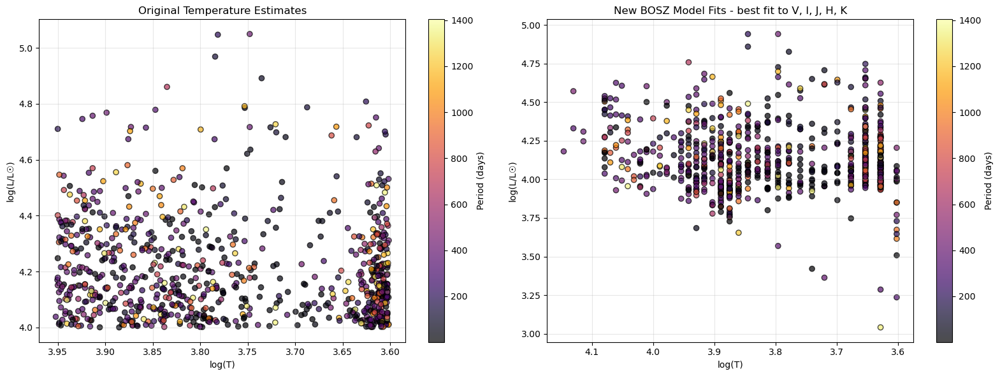

In [17]:
model_fitting = pd.read_csv('ysg_temp_fitting_results.csv')
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Old estimations
periods = stats['best_period']
x_old = stats['logT']
y_old = stats['logL']
sc1 = ax1.scatter(x_old, y_old, c=periods, edgecolor='k', label='old estimations', alpha=0.7, cmap='inferno')
ax1.set_xlabel('log(T)')
ax1.set_ylabel('log(L/L☉)')
ax1.set_title('Original Temperature Estimates')
ax1.invert_xaxis()
ax1.grid(True, alpha=0.3)

# New estimations
x_new = model_fitting['logT_cut_1']
y_new = model_fitting['logL_cut_1']
sc2 = ax2.scatter(x_new, y_new, c=periods, edgecolor='k', label='new estimations', alpha=0.7, cmap='inferno')
ax2.set_xlabel('log(T)')
ax2.set_ylabel('log(L/L☉)')
ax2.set_title('New BOSZ Model Fits - best fit to V, I, J, H, K')
ax2.invert_xaxis()
ax2.grid(True, alpha=0.3)

cbar1 = plt.colorbar(sc1, ax=ax1)
cbar1.set_label('Period (days)')
cbar2 = plt.colorbar(sc2, ax=ax2)
cbar2.set_label('Period (days)')
plt.tight_layout()
plt.show()


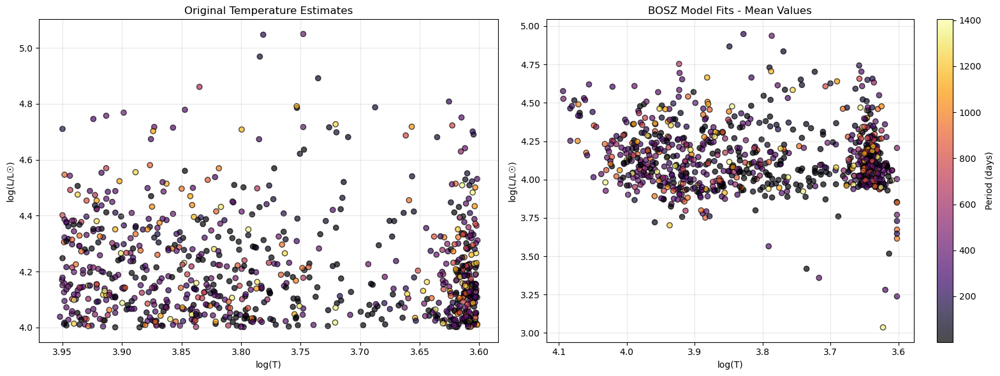

In [18]:
temp_stats = pd.read_csv('ysg_temp_fitting_summary.csv')

logT = temp_stats['logT_mean_cut']
logL = temp_stats['logL_mean_cut']

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Old estimations
periods = stats['best_period']
x_old = stats['logT']
y_old = stats['logL']
sc1 = ax1.scatter(x_old, y_old, c=periods, edgecolor='k', label='old estimations', alpha=0.7, cmap='inferno')
ax1.set_xlabel('log(T)')
ax1.set_ylabel('log(L/L☉)')
ax1.set_title('Original Temperature Estimates')
ax1.invert_xaxis()
ax1.grid(True, alpha=0.3)

sc = ax2.scatter(logT, logL, c=periods, edgecolor='k', label='new estimations', alpha=0.7, cmap='inferno')
ax2.set_xlabel('log(T)')
ax2.set_ylabel('log(L/L☉)')
ax2.set_title('BOSZ Model Fits - Mean Values')
ax2.invert_xaxis()
ax2.grid(True, alpha=0.3)
cbar = plt.colorbar(sc, ax=ax2)
cbar.set_label('Period (days)')
plt.tight_layout()
plt.show()

In [19]:
index = 0
RA = coords['RA'].iloc[index]
dec = coords['DEC'].iloc[index]
output_filename = f'temp_fitting/{RA}_{dec}.parquet'
model_fitting = pd.read_parquet(output_filename)
print(model_fitting.head(10))

   star_idx        RA        DEC  teff_full  logg_full  av_full  logL_full  \
0         0  7.521702 -73.913918       6500        1.0      0.4   4.017378   

   chi2_full  best_iteration_full  best_K_variation_full  \
0   0.708807                  491                      0   

                            best_model_full_filename  teff_cut  logg_cut  \
0  /Users/shannonbowes/Research/ysg/candidates_an...      6750       1.5   

   av_cut  logL_cut  chi2_cut  best_iteration_cut  best_K_variation_cut  \
0     0.5   4.03857  0.021055                 545                     1   

                             best_model_cut_filename  
0  /Users/shannonbowes/Research/ysg/candidates_an...  


   iteration  K_variation  teff  logg   av      logL  chi2_full   chi2_cut  \
0          0            0  6500   1.5  0.4  4.024269   4.877381   4.665240   
1          0            1  6250   1.0  0.2  4.022541   2.060554   1.854842   
2          0            2  6500   2.0  0.3  4.027772   2.928882   2.120750   
3          0           -1  6500   2.0  0.4  4.030489  11.122810  10.672332   
4          0           -2  6250   1.0  0.3  4.026318  20.734681  19.027452   
5          1            0  6500   1.0  0.4  4.018333  25.826338  12.133808   
6          1            1  6500   1.0  0.4  4.008333  33.364923  20.693660   
7          1            2  6750   1.5  0.5  4.012028  45.501455  31.191938   
8          1           -1  6750   1.5  0.6  4.015387  20.863256   8.778043   
9          1           -2  7000   1.5  0.8  4.014147  19.316422   9.037013   

                                      model_filename  star_idx  
0  /Users/shannonbowes/Research/ysg/candidates_an...         0  
1  /Users/s

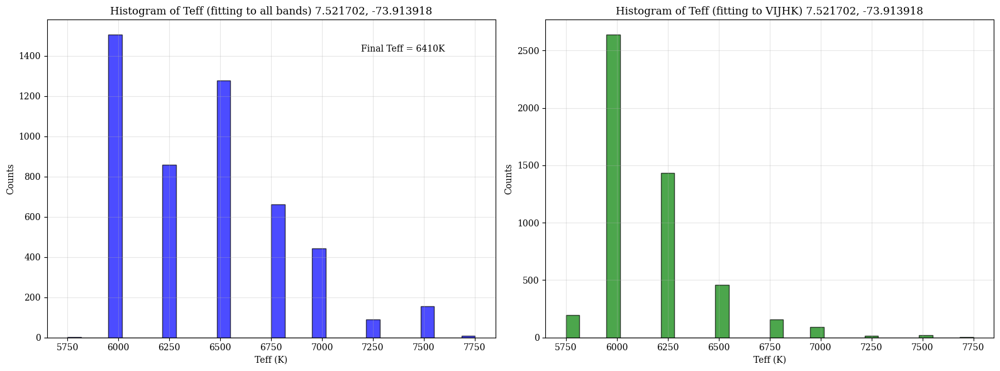

   iteration  K_variation  teff  logg   av      logL  chi2_full   chi2_cut  \
0          0            0  7250   2.0  0.2  3.892411  60.879461  30.540576   
1          0            1  7500   2.0  0.3  3.890177  71.730406  41.124401   
2          0            2  7000   2.0  0.0  3.883696  68.771811  56.891765   
3          0           -1  7250   2.5  0.2  3.900762  63.966135  30.224039   
4          0           -2  8250   2.0  0.7  3.904535  48.981495  17.678251   
5          1            0  8250   2.0  0.7  3.904012  46.806527  16.159387   
6          1            1  7000   2.0  0.1  3.891568  31.463518  13.747897   
7          1            2  7250   2.0  0.2  3.891888  37.770860  18.586472   
8          1           -1  8500   2.0  0.8  3.911519  60.985991  26.201672   
9          1           -2  8750   2.0  0.9  3.915495  82.714177  33.689916   

                                      model_filename  star_idx  
0  /Users/shannonbowes/Research/ysg/candidates_an...       800  
1  /Users/s

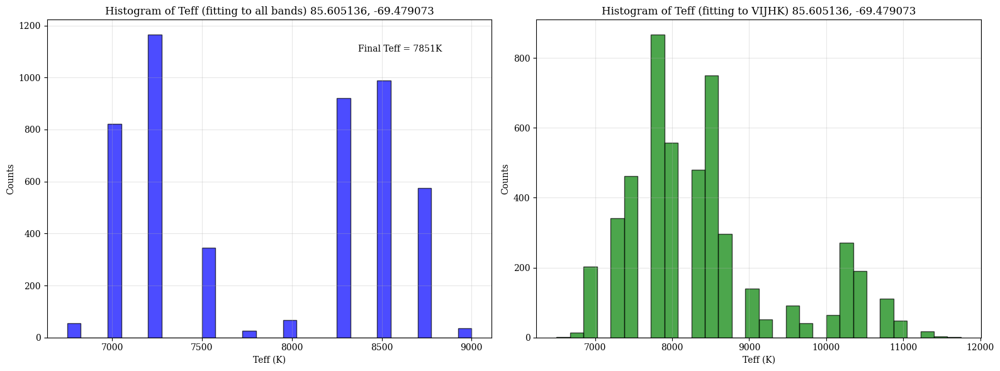

In [25]:
# histograms for specific star:
def histo(index):
    RA = coords['RA'].iloc[index]
    dec = coords['DEC'].iloc[index]
    final_teff = temp_stats['teff_mean_full'].iloc[index]
    output_filename_full = f'temp_fitting/{RA}_{dec}_full.parquet'
    # read parquet file:
    model_fitting_full = pd.read_parquet(output_filename_full)
    # print the first ten lines
    print(model_fitting_full.head(10))
    # plot histograms for logT and logL
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    ax1.hist(model_fitting_full['teff'], bins=30, color='blue', alpha=0.7, edgecolor='black')
    # annotate final teff in upper right corner
    ax1.annotate(f'Final Teff = {final_teff:.0f}K', xy=(0.7, 0.9), xycoords='axes fraction')
    # ax1.annotate(f'Final Teff = {final_teff:.0f}K', xy=(final_teff, 5))
    ax1.set_xlabel('Teff (K)')
    ax1.set_ylabel('Counts')
    ax1.set_title(f'Histogram of Teff (fitting to all bands) {RA}, {dec}')
    ax1.grid(True, alpha=0.3)

    output_filename_cut = f'temp_fitting/{RA}_{dec}_cut.parquet'
    model_fitting_cut = pd.read_parquet(output_filename_cut)
    ax2.hist(model_fitting_cut['teff'], bins=30, color='green', alpha=0.7, edgecolor='black')
    ax2.set_xlabel('Teff (K)')
    ax2.set_ylabel('Counts')
    ax2.set_title(f'Histogram of Teff (fitting to VIJHK) {RA}, {dec}')
    ax2.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
histo(0)
histo(800)

# for unusual/interesting stars:

# Teff not far off:

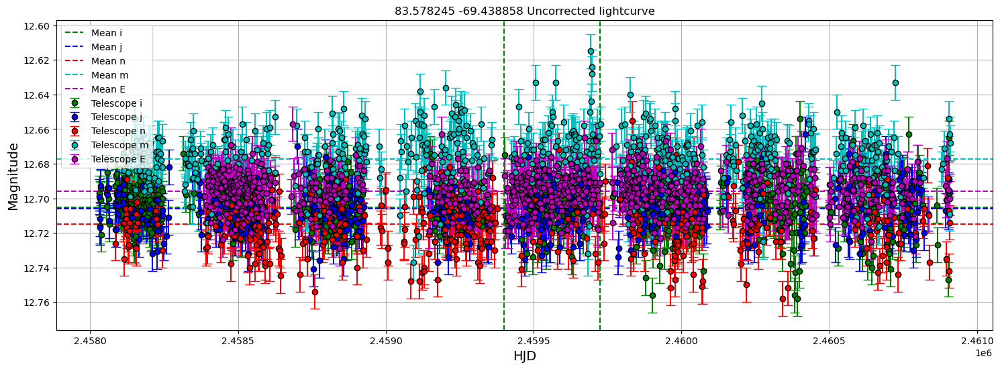

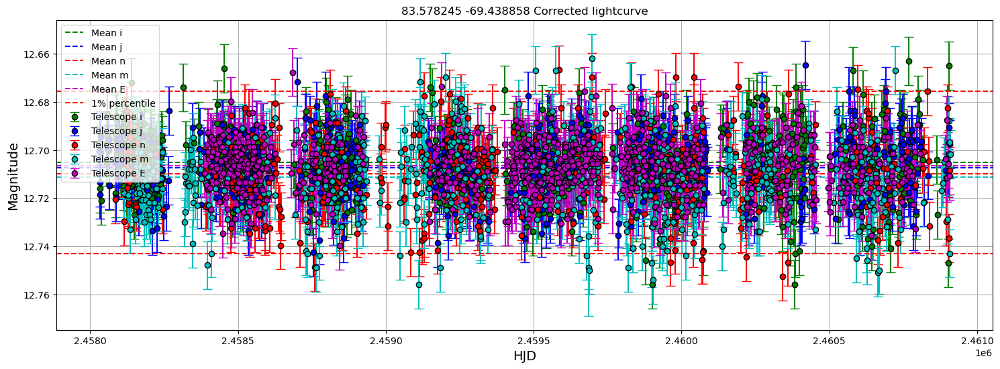

Best frequency: 0.263114 1/day, Best period: 3.80 days, Max power: 0.023, False alarm probability: 6.057e-11
False alarm level for 1.0%: 9.875e-03
Grid sampled at 26961 points


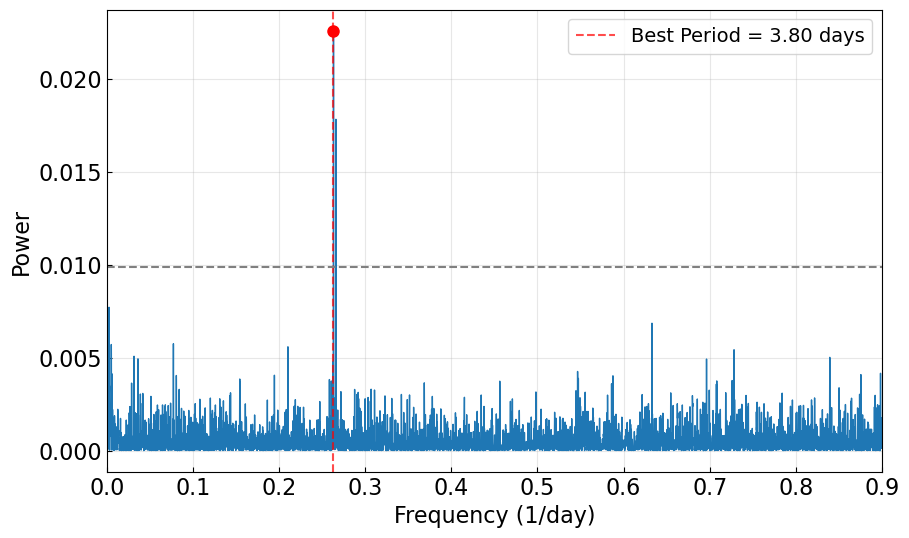

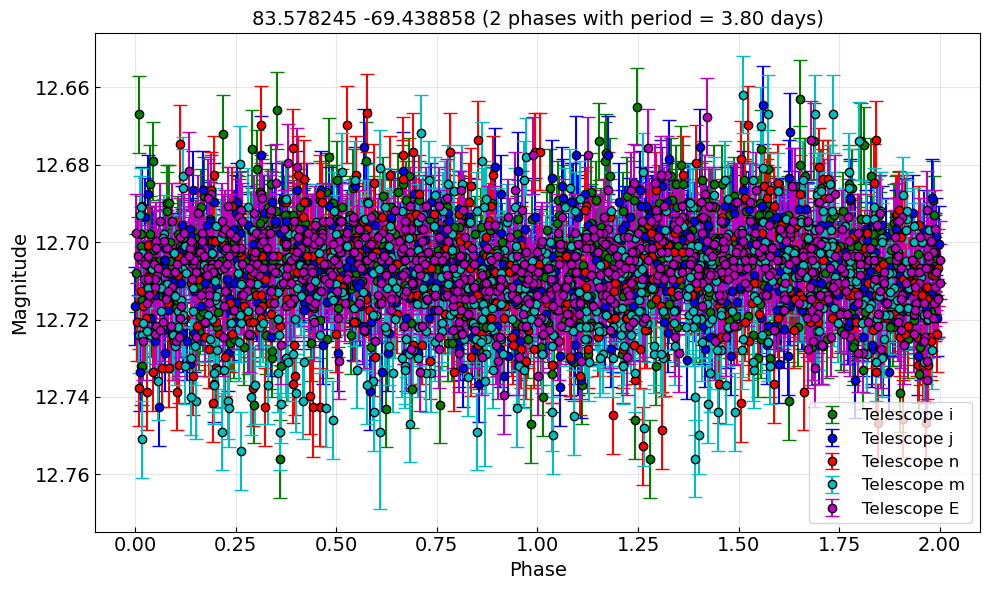

Average scatter (amplitude) per 10 point phase bin: 1.079 mJy


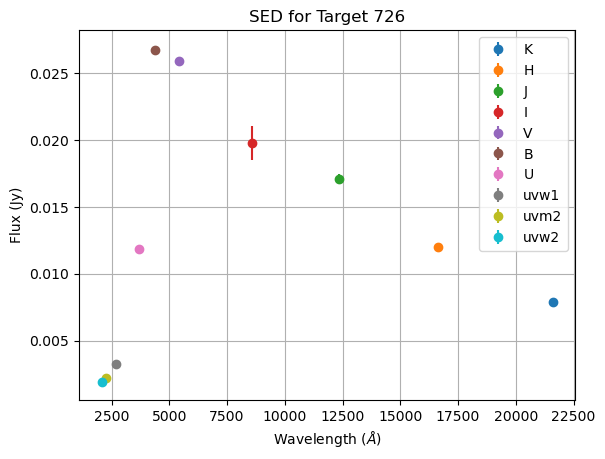

[0.2631144  0.26591639]
Amplitude metrics:
	Lower 5% percentile: -0.63 mJy, 12.69 mags
	Upper 5% percentile: 0.57 mJy, 12.73 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 5% of data) (g-band: True): 1.20 mJy, 0.04 mags
Amplitude metrics:
	Lower 1% percentile: -0.96 mJy, 12.68 mags
	Upper 1% percentile: 0.89 mJy, 12.74 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 1% of data) (g-band: True): 1.85 mJy, 0.07 mags
	Largest amplitude of variability (g-band: True): 2.60 mJy, 0.09 mags
	Average amplitude across all periods: 0.883 mJy
	Standard deviation of amplitudes: 0.372 mJy


/var/folders/34/3847lqd14j78mfm70_z1c_r00000gn/T/ipykernel_2349/161380346.py:139: RuntimeWarning: divide by zero encountered in log10
  plt.plot(wave['wave'], -2.5 * np.log10(newflux/tmass_k_zp), #+ plot_mag_shift,


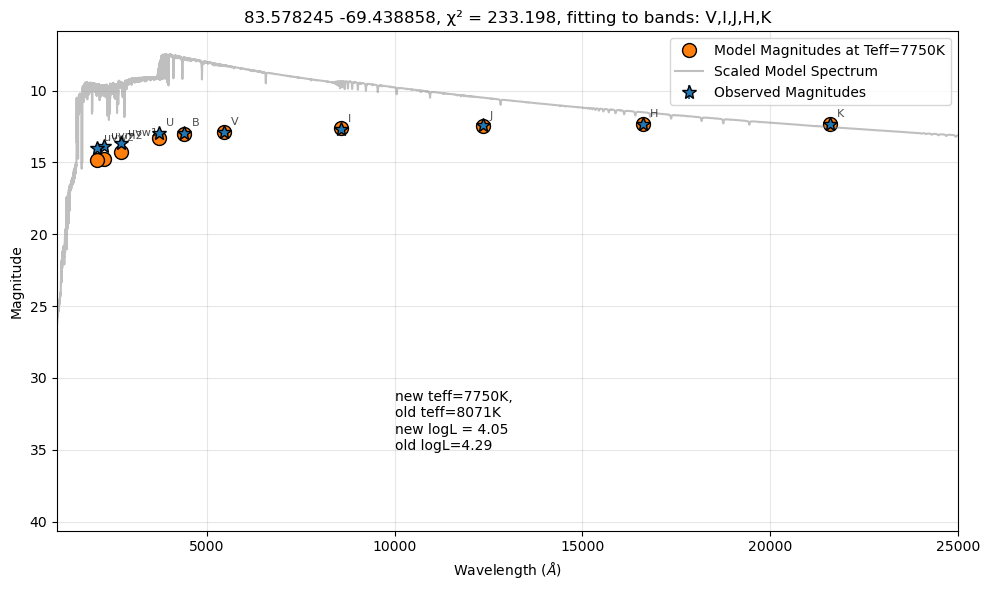

Previous Teff: 8070.890238426216K, logT_old = 3.9069214410804887. New fit Teff: 7750K, logT_new = 3.88930170250631


In [62]:
info(726)
new_teff = model_fitting[model_fitting['star_index'] == 726][['teff_cut_1']]
fit_models_to_star(star_idx=726, show=True)
print(f"Previous Teff: {model_fitting[model_fitting['star_index'] == 726]['orig_teff'].iloc[0]}K, logT_old = {model_fitting[model_fitting['star_index'] == 726]['orig_logT'].iloc[0]}. New fit Teff: {model_fitting[model_fitting['star_index'] == 726]['teff_cut_1'].iloc[0]}K, logT_new = {model_fitting[model_fitting['star_index'] == 726]['logT_cut_1'].iloc[0]}")

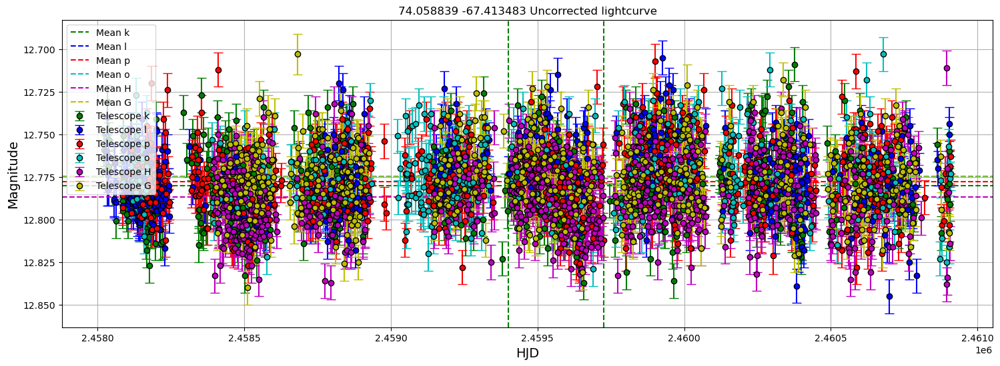

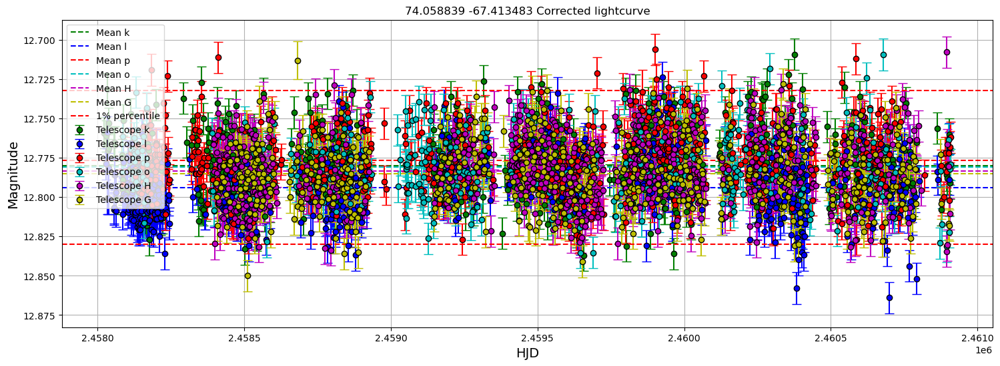

Best frequency: 0.277344 1/day, Best period: 3.61 days, Max power: 0.246, False alarm probability: 4.538e-203
False alarm level for 1.0%: 8.839e-03
Grid sampled at 30486 points


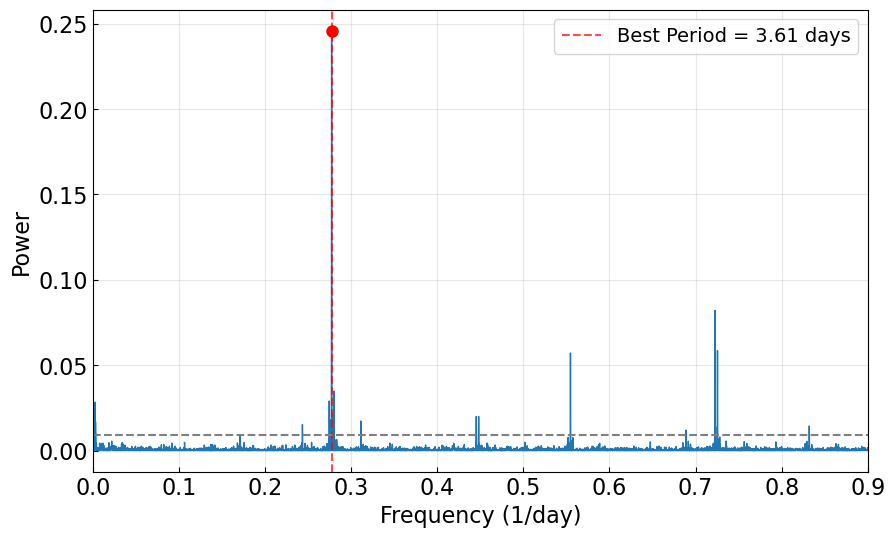

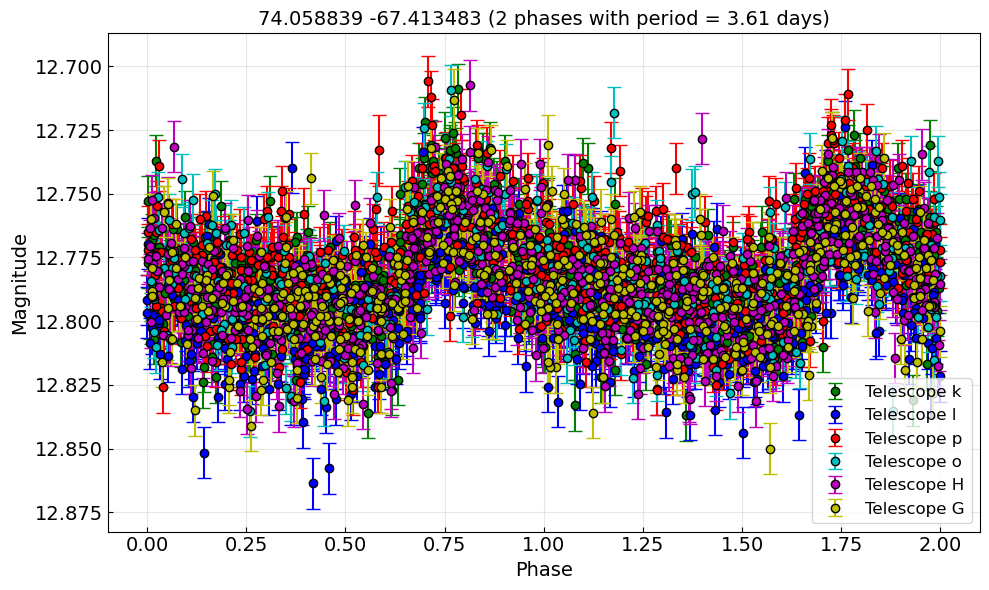

Average scatter (amplitude) per 10 point phase bin: 1.318 mJy


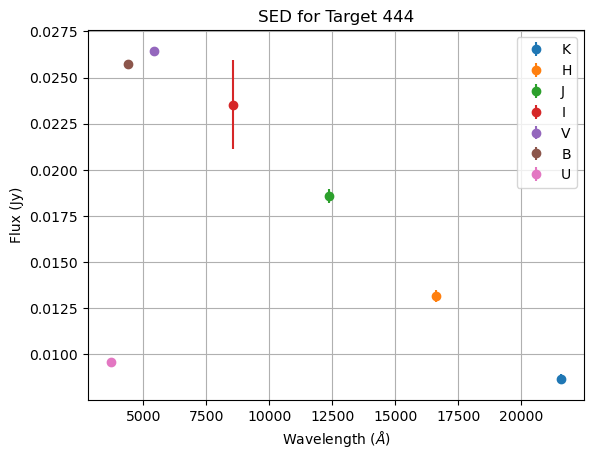

[0.00131278 0.00258128 0.00314178 0.00349578 0.24344857 0.27457104
 0.27684254 0.27734404 0.27784554 0.28011704 0.31129851 0.4453169
 0.44808989 0.5547028  0.68875068 0.72267565 0.72317715 0.72544865
 0.83203206]
Amplitude metrics:
	Lower 5% percentile: -0.80 mJy, 12.75 mags
	Upper 5% percentile: 1.01 mJy, 12.82 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 5% of data) (g-band: True): 1.80 mJy, 0.07 mags
Amplitude metrics:
	Lower 1% percentile: -1.14 mJy, 12.73 mags
	Upper 1% percentile: 1.39 mJy, 12.83 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 1% of data) (g-band: True): 2.52 mJy, 0.10 mags
	Largest amplitude of variability (g-band: True): 4.06 mJy, 0.16 mags
	Average amplitude across all periods: 1.353 mJy
	Standard deviation of amplitudes: 0.464 mJy


/var/folders/34/3847lqd14j78mfm70_z1c_r00000gn/T/ipykernel_2349/161380346.py:139: RuntimeWarning: divide by zero encountered in log10
  plt.plot(wave['wave'], -2.5 * np.log10(newflux/tmass_k_zp), #+ plot_mag_shift,


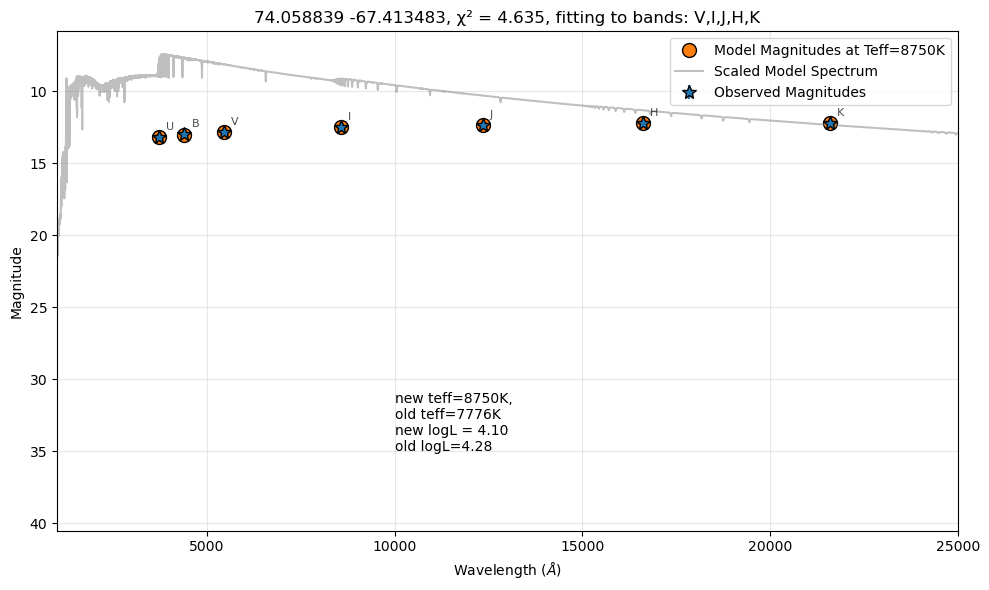

Previous Teff: 7775.65131502553K, logT_old = 3.890736777206846. New fit Teff: 8750K, logT_new = 3.942008053022313


In [63]:
target_index=444
info(target_index)
new_teff = fit_models_to_star(target_index, show=True)
print(f"Previous Teff: {model_fitting[model_fitting['star_index'] == target_index]['orig_teff'].iloc[0]}K, logT_old = {model_fitting[model_fitting['star_index'] == target_index]['orig_logT'].iloc[0]}. New fit Teff: {model_fitting[model_fitting['star_index'] == target_index]['teff_cut_1'].iloc[0]}K, logT_new = {model_fitting[model_fitting['star_index'] == target_index]['logT_cut_1'].iloc[0]}")

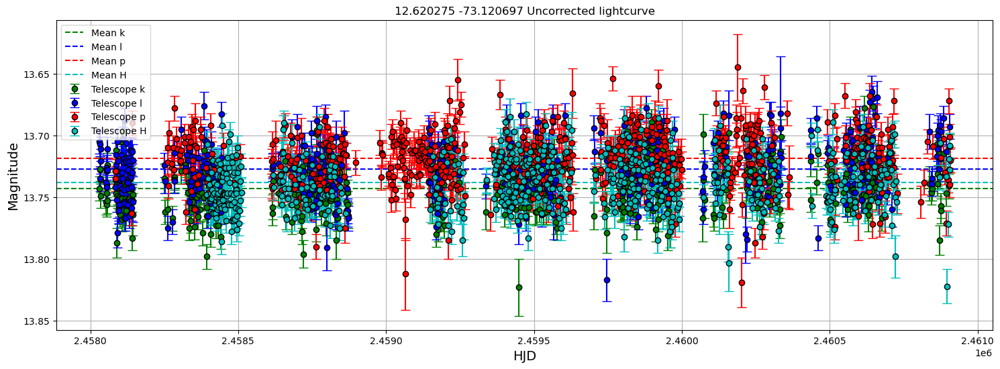

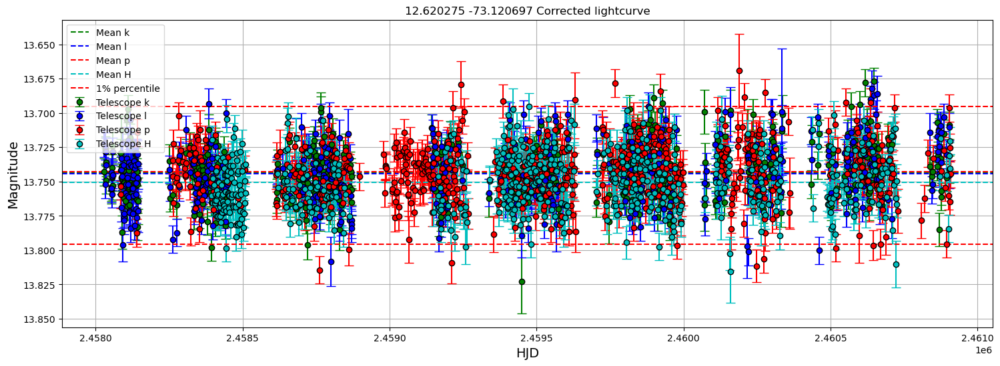

Best frequency: 0.167929 1/day, Best period: 5.95 days, Max power: 0.216, False alarm probability: 7.312e-111
False alarm level for 1.0%: 1.328e-02
Grid sampled at 19586 points


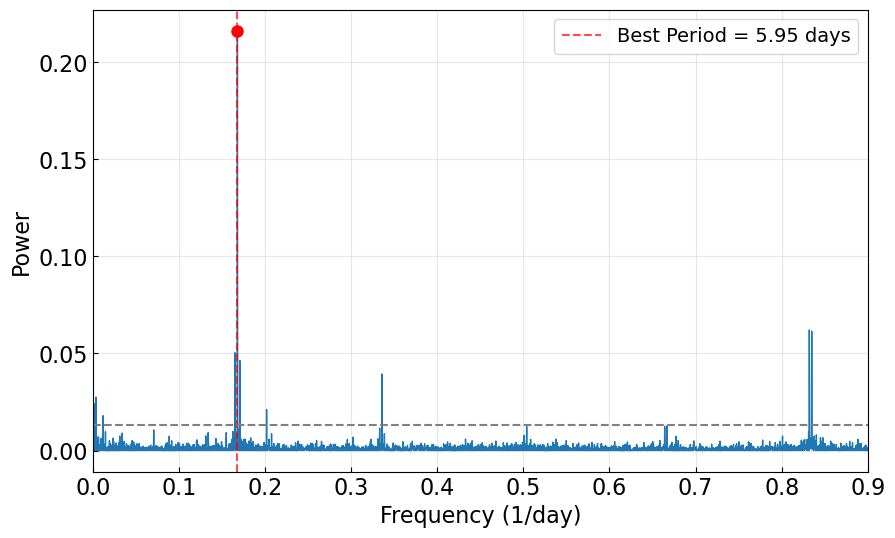

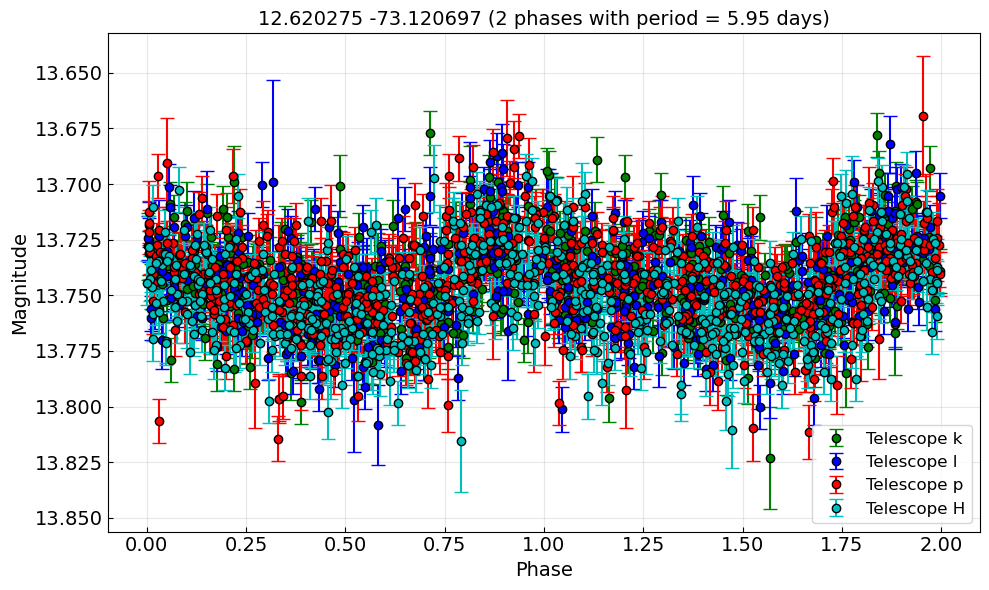

Average scatter (amplitude) per 10 point phase bin: 0.586 mJy


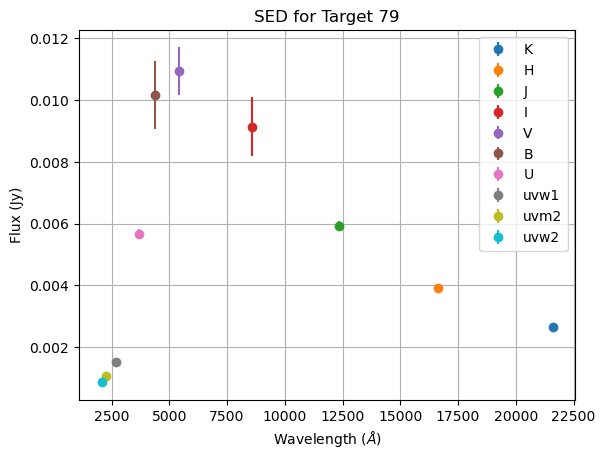

[0.00253169 0.00386332 0.01199081 0.16512751 0.16792851 0.17072951
 0.20181603 0.33585083 0.8320872  0.8348882 ]
Amplitude metrics:
	Lower 5% percentile: -0.34 mJy, 13.71 mags
	Upper 5% percentile: 0.37 mJy, 13.78 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 5% of data) (g-band: True): 0.71 mJy, 0.07 mags
Amplitude metrics:
	Lower 1% percentile: -0.52 mJy, 13.70 mags
	Upper 1% percentile: 0.55 mJy, 13.80 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 1% of data) (g-band: True): 1.06 mJy, 0.10 mags
	Largest amplitude of variability (g-band: True): 1.63 mJy, 0.15 mags
	Average amplitude across all periods: 0.590 mJy
	Standard deviation of amplitudes: 0.214 mJy


/var/folders/34/3847lqd14j78mfm70_z1c_r00000gn/T/ipykernel_2349/161380346.py:139: RuntimeWarning: divide by zero encountered in log10
  plt.plot(wave['wave'], -2.5 * np.log10(newflux/tmass_k_zp), #+ plot_mag_shift,


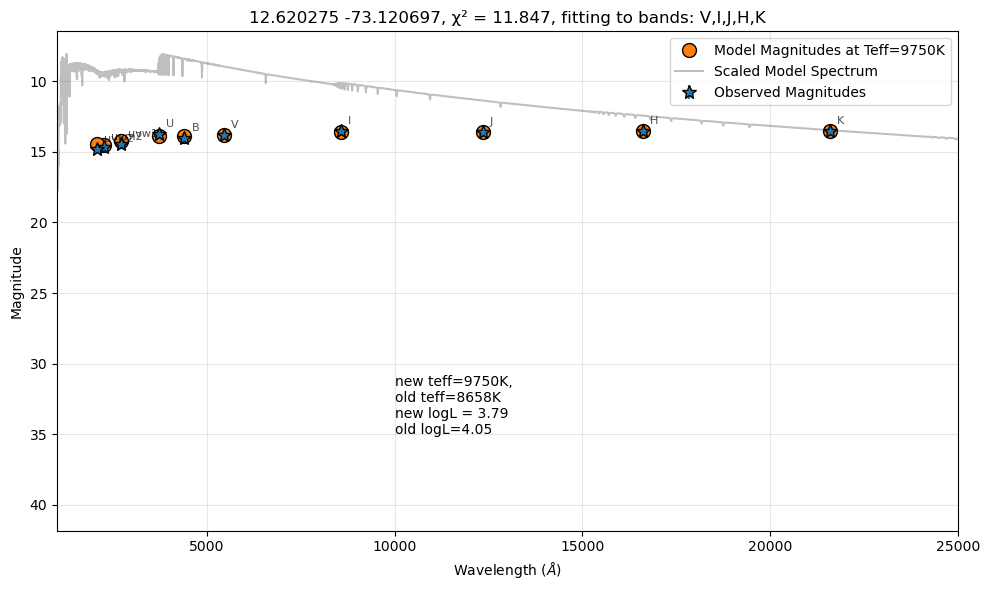

Previous Teff: 8658.05292675768K, logT_old = 3.93742023633144. New fit Teff: 9750K, logT_new = 3.989004615698537


In [64]:
target_index=79
info(target_index)
new_teff = fit_models_to_star(target_index, show=True)
print(f"Previous Teff: {model_fitting[model_fitting['star_index'] == target_index]['orig_teff'].iloc[0]}K, logT_old = {model_fitting[model_fitting['star_index'] == target_index]['orig_logT'].iloc[0]}. New fit Teff: {model_fitting[model_fitting['star_index'] == target_index]['teff_cut_1'].iloc[0]}K, logT_new = {model_fitting[model_fitting['star_index'] == target_index]['logT_cut_1'].iloc[0]}")

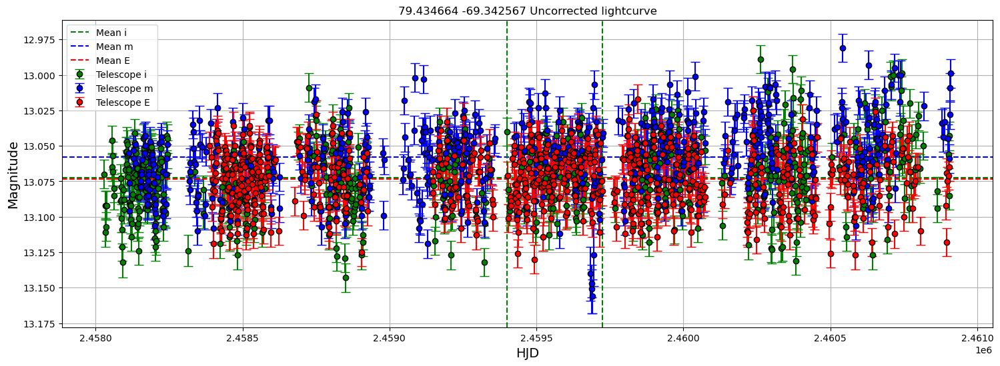

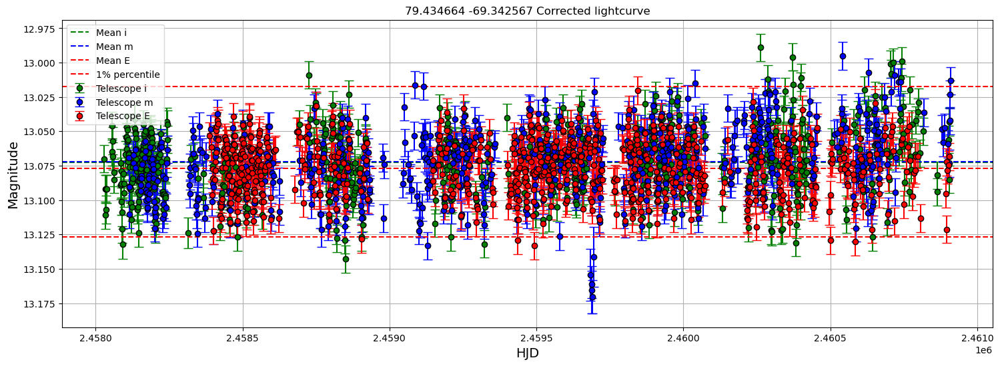

Best frequency: 0.035737 1/day, Best period: 27.98 days, Max power: 0.495, False alarm probability: 1.525e-290
False alarm level for 1.0%: 1.442e-02
Grid sampled at 17914 points


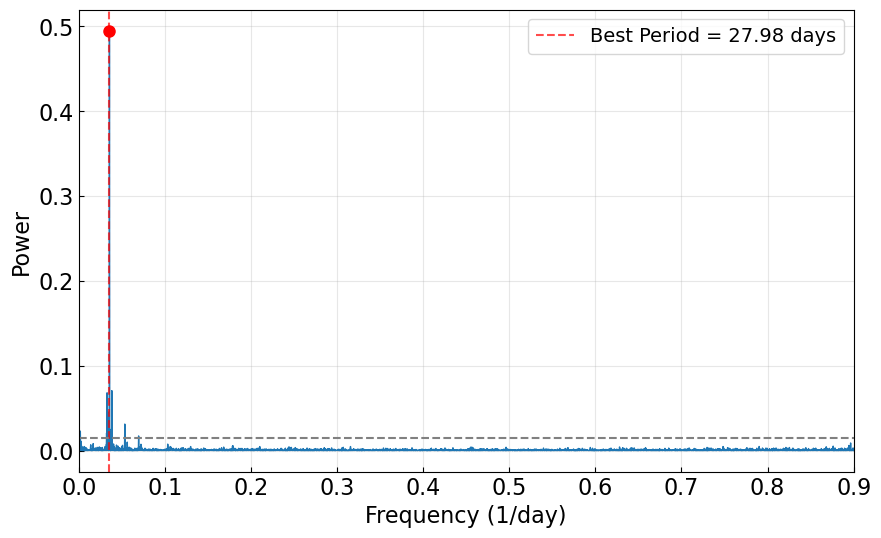

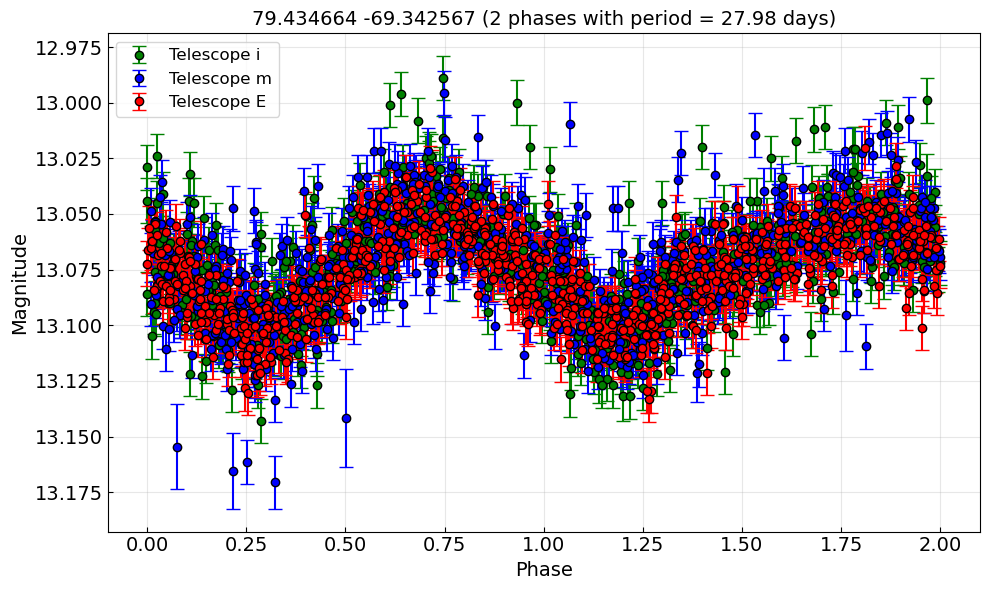

Average scatter (amplitude) per 10 point phase bin: 0.972 mJy


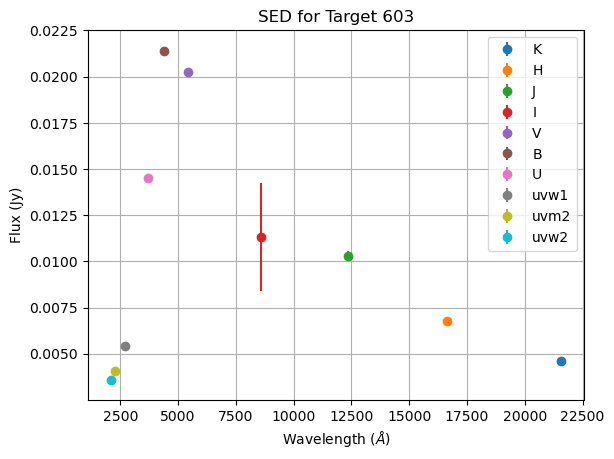

[0.00189962 0.03242368 0.03297593 0.03518491 0.03573715 0.03623919
 0.03849838 0.05355959 0.06962489]
Amplitude metrics:
	Lower 5% percentile: -0.77 mJy, 13.04 mags
	Upper 5% percentile: 0.72 mJy, 13.11 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 5% of data) (g-band: True): 1.49 mJy, 0.08 mags
Amplitude metrics:
	Lower 1% percentile: -1.02 mJy, 13.02 mags
	Upper 1% percentile: 1.15 mJy, 13.13 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 1% of data) (g-band: True): 2.17 mJy, 0.11 mags
	Largest amplitude of variability (g-band: True): 3.55 mJy, 0.18 mags
	Average amplitude across all periods: 1.684 mJy
	Standard deviation of amplitudes: 0.353 mJy


/var/folders/34/3847lqd14j78mfm70_z1c_r00000gn/T/ipykernel_2349/161380346.py:139: RuntimeWarning: divide by zero encountered in log10
  plt.plot(wave['wave'], -2.5 * np.log10(newflux/tmass_k_zp), #+ plot_mag_shift,


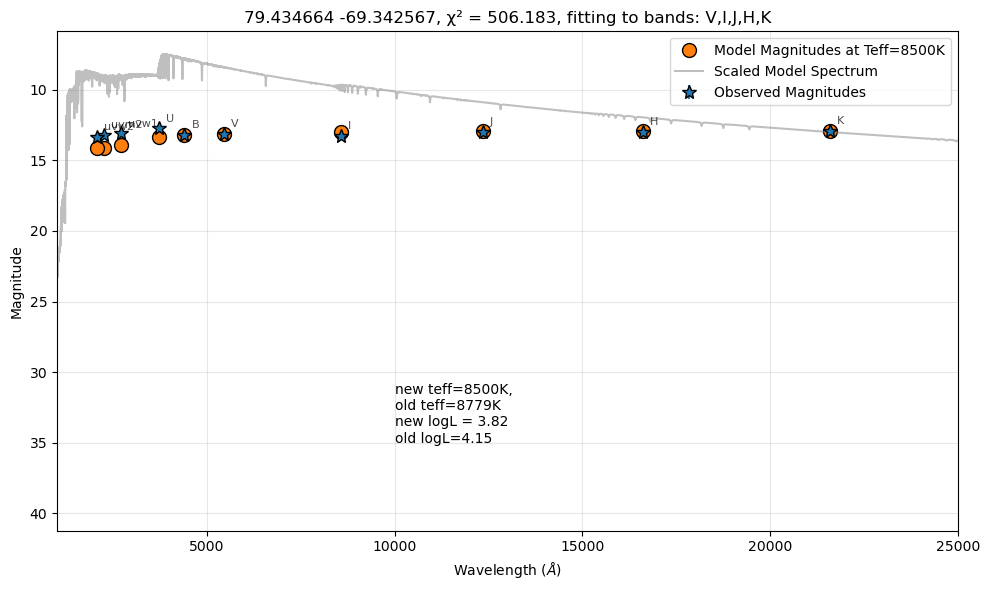

Previous Teff: 8779.396732960868K, logT_old = 3.943464674841481. New fit Teff: 8500K, logT_new = 3.929418925714293


In [67]:
target_index=603
info(target_index)
new_teff = fit_models_to_star(target_index, show=True)
print(f"Previous Teff: {model_fitting[model_fitting['star_index'] == target_index]['orig_teff'].iloc[0]}K, logT_old = {model_fitting[model_fitting['star_index'] == target_index]['orig_logT'].iloc[0]}. New fit Teff: {model_fitting[model_fitting['star_index'] == target_index]['teff_cut_1'].iloc[0]}K, logT_new = {model_fitting[model_fitting['star_index'] == target_index]['logT_cut_1'].iloc[0]}")

# Teff inaccurate:

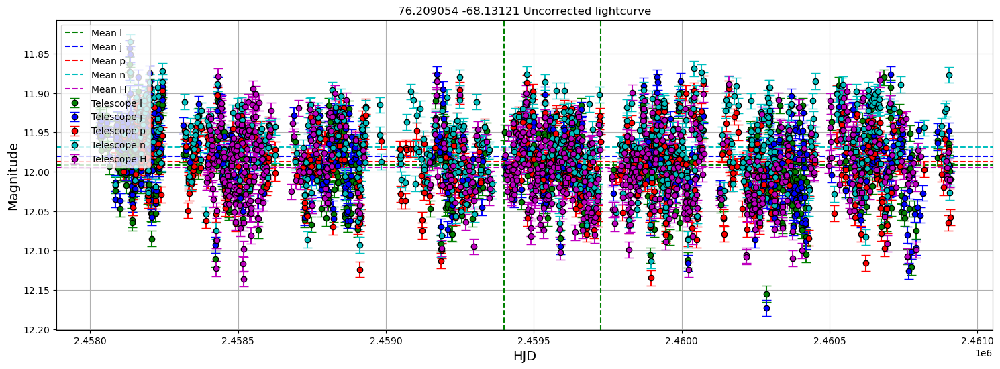

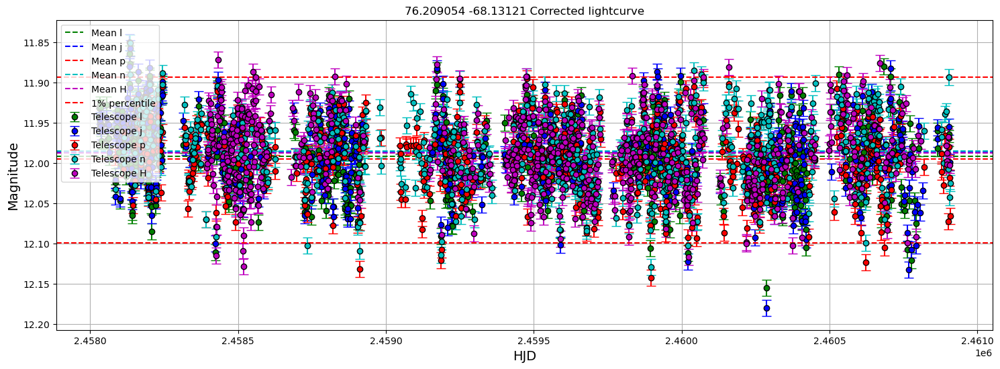

Best frequency: 0.054798 1/day, Best period: 18.25 days, Max power: 0.010, False alarm probability: 1.986e-03
False alarm level for 1.0%: 9.171e-03
Grid sampled at 28624 points


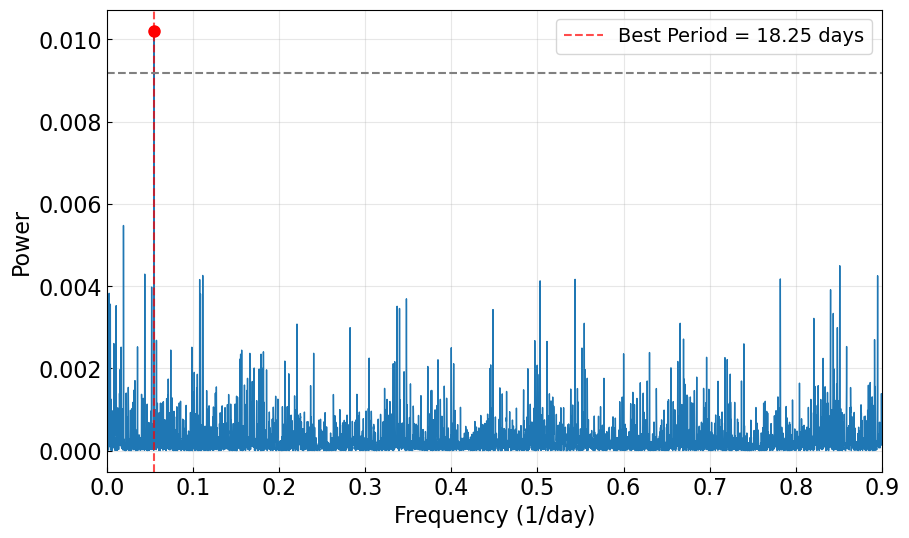

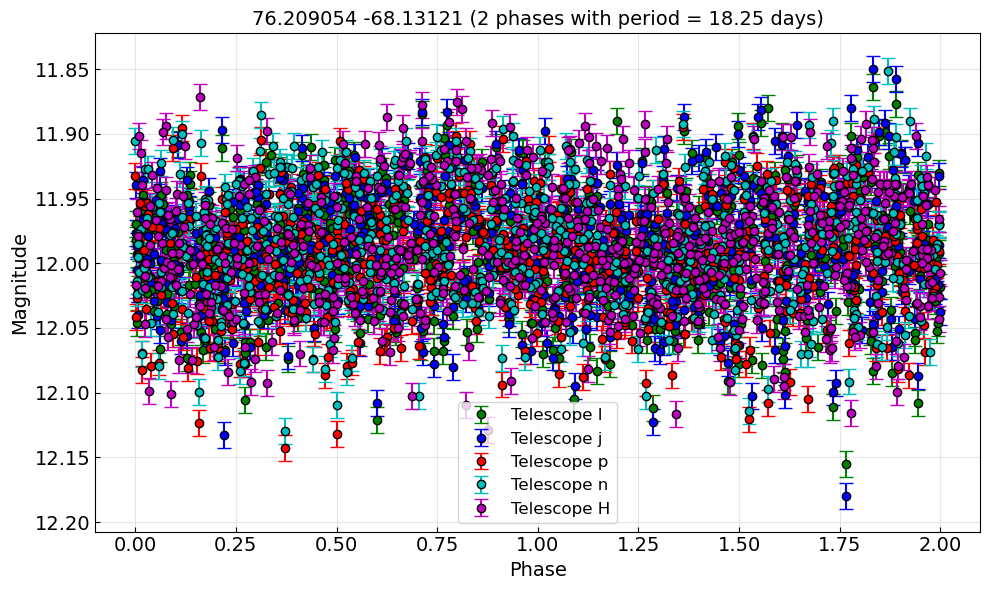

Average scatter (amplitude) per 10 point phase bin: 6.289 mJy


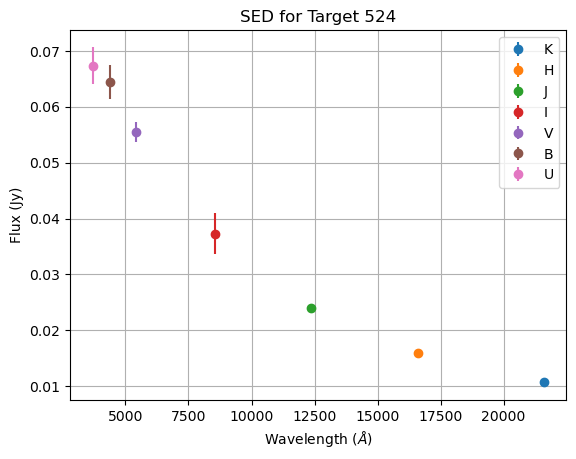

[0.05479842]
Amplitude metrics:
	Lower 5% percentile: -3.86 mJy, 11.92 mags
	Upper 5% percentile: 3.90 mJy, 12.06 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 5% of data) (g-band: True): 7.76 mJy, 0.15 mags
Amplitude metrics:
	Lower 1% percentile: -5.61 mJy, 11.89 mags
	Upper 1% percentile: 5.36 mJy, 12.10 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 1% of data) (g-band: True): 10.98 mJy, 0.21 mags
	Largest amplitude of variability (g-band: True): 17.29 mJy, 0.33 mags
	Average amplitude across all periods: 7.820 mJy
	Standard deviation of amplitudes: 1.922 mJy


/var/folders/34/3847lqd14j78mfm70_z1c_r00000gn/T/ipykernel_2349/161380346.py:139: RuntimeWarning: divide by zero encountered in log10
  plt.plot(wave['wave'], -2.5 * np.log10(newflux/tmass_k_zp), #+ plot_mag_shift,


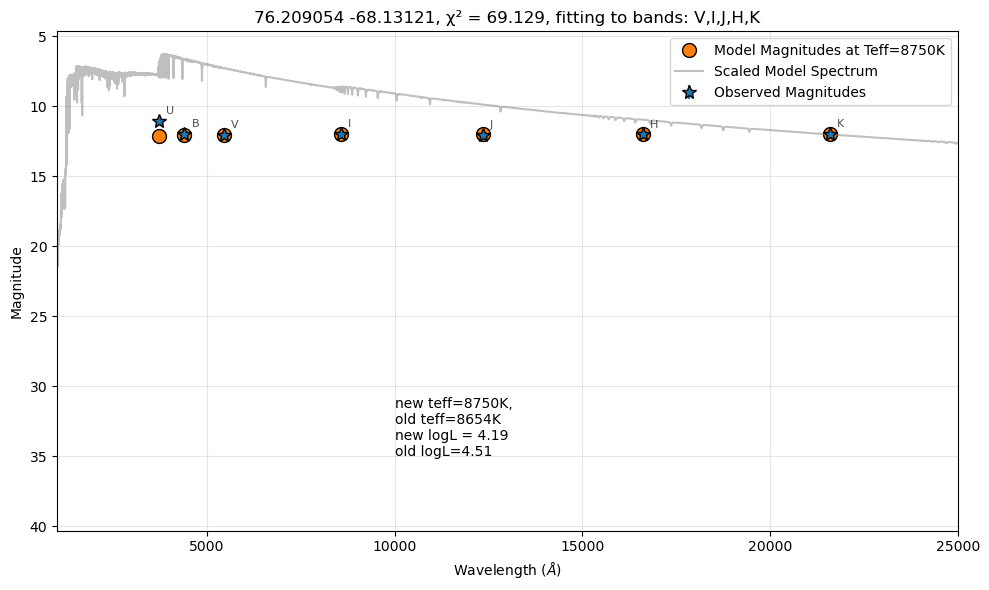

Previous Teff: 8654.261883885933K, logT_old = 3.937230033109724. New fit Teff: 8750K, logT_new = 3.942008053022313


In [68]:
# star matched to the hottest model we have
target_index=524
info(target_index)
new_teff = fit_models_to_star(target_index, show=True)
print(f"Previous Teff: {model_fitting[model_fitting['star_index'] == target_index]['orig_teff'].iloc[0]}K, logT_old = {model_fitting[model_fitting['star_index'] == target_index]['orig_logT'].iloc[0]}. New fit Teff: {model_fitting[model_fitting['star_index'] == target_index]['teff_cut_1'].iloc[0]}K, logT_new = {model_fitting[model_fitting['star_index'] == target_index]['logT_cut_1'].iloc[0]}")

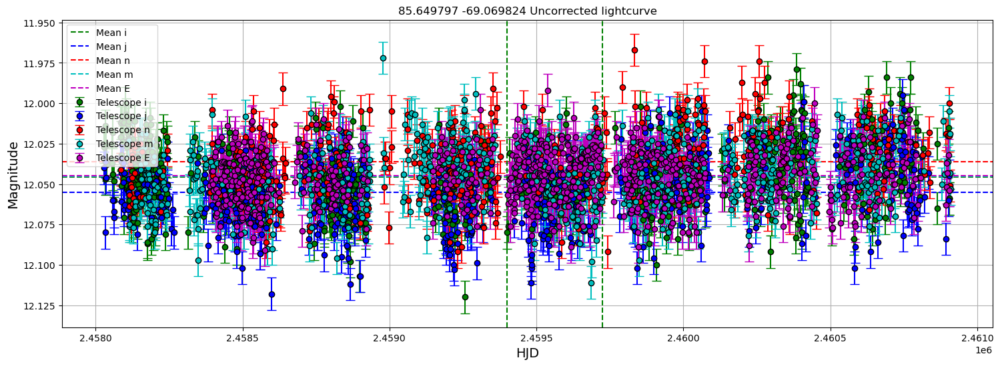

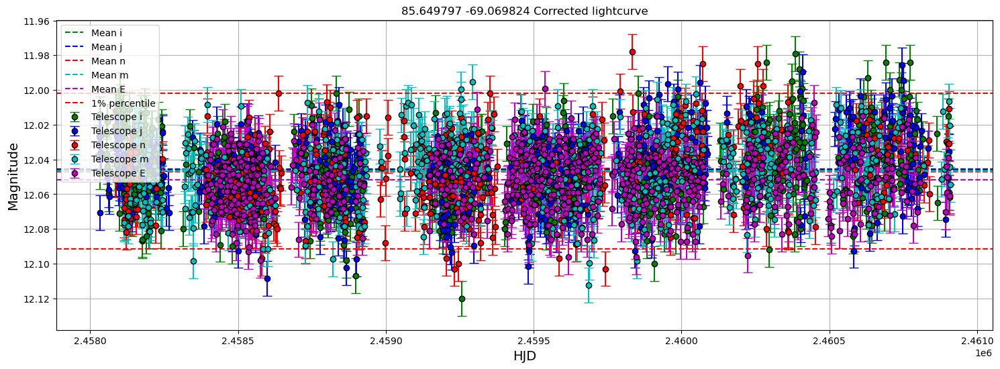

Best frequency: 0.290032 1/day, Best period: 3.45 days, Max power: 0.116, False alarm probability: 4.192e-76
False alarm level for 1.0%: 9.847e-03
Grid sampled at 27042 points


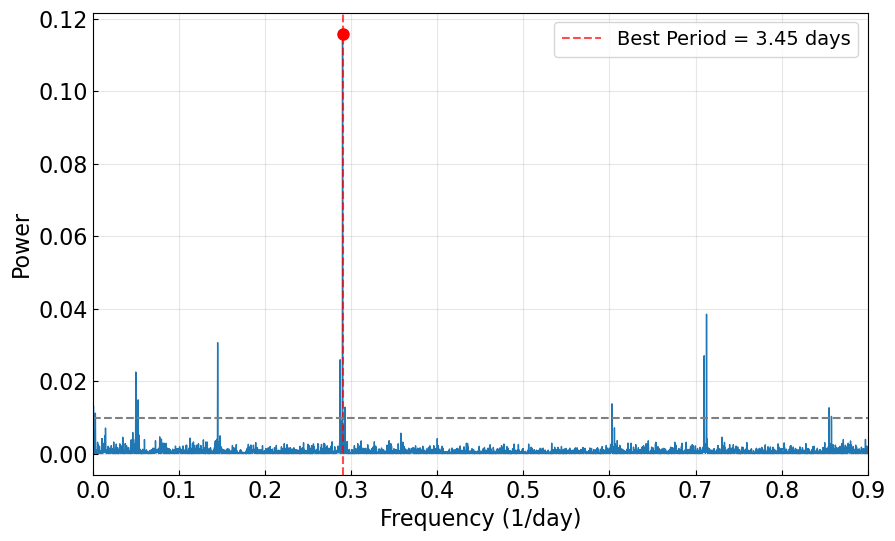

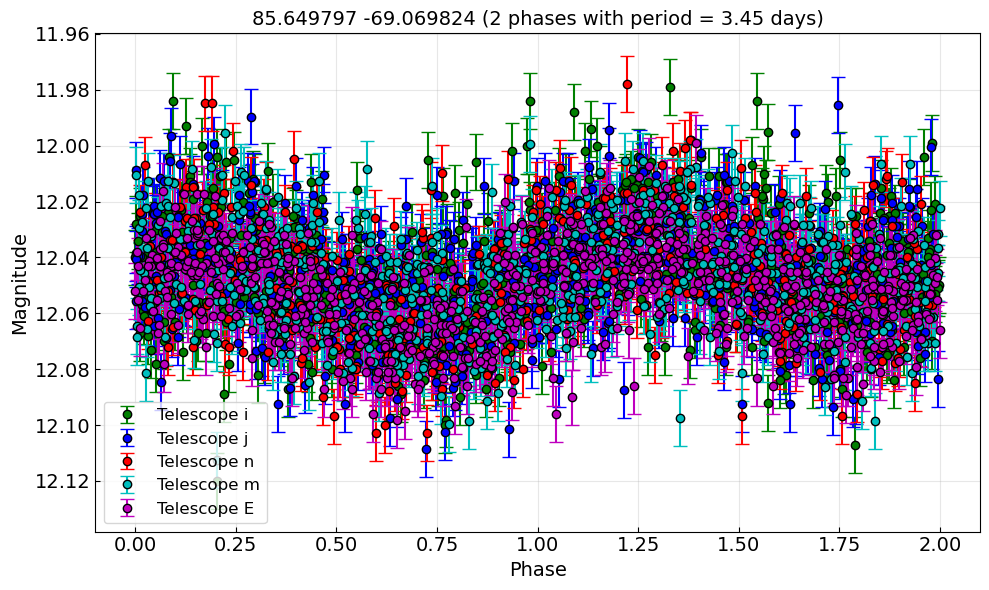

Average scatter (amplitude) per 10 point phase bin: 2.715 mJy


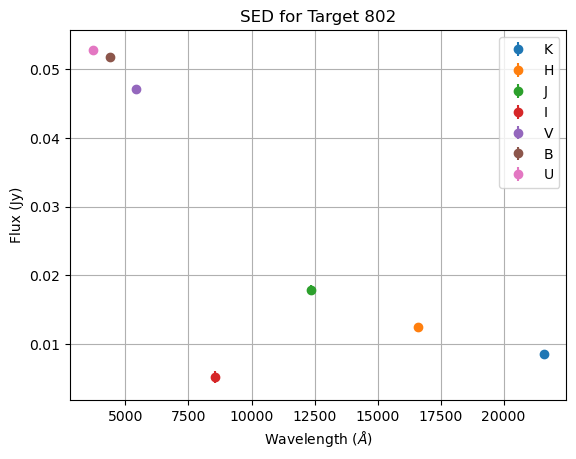

[7.61234123e-04 2.98945992e-03 4.99484872e-02 5.26755695e-02
 1.44997283e-01 2.87271163e-01 2.90031502e-01 2.92858356e-01
 6.02947570e-01 7.09968922e-01 7.12729262e-01 8.55003142e-01
 8.57796738e-01]
Amplitude metrics:
	Lower 5% percentile: -1.57 mJy, 12.02 mags
	Upper 5% percentile: 1.67 mJy, 12.08 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 5% of data) (g-band: True): 3.24 mJy, 0.06 mags
Amplitude metrics:
	Lower 1% percentile: -2.19 mJy, 12.00 mags
	Upper 1% percentile: 2.36 mJy, 12.09 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 1% of data) (g-band: True): 4.55 mJy, 0.09 mags
	Largest amplitude of variability (g-band: True): 7.20 mJy, 0.14 mags
	Average amplitude across all periods: 2.067 mJy
	Standard deviation of amplitudes: 0.868 mJy


/var/folders/34/3847lqd14j78mfm70_z1c_r00000gn/T/ipykernel_2349/161380346.py:139: RuntimeWarning: divide by zero encountered in log10
  plt.plot(wave['wave'], -2.5 * np.log10(newflux/tmass_k_zp), #+ plot_mag_shift,


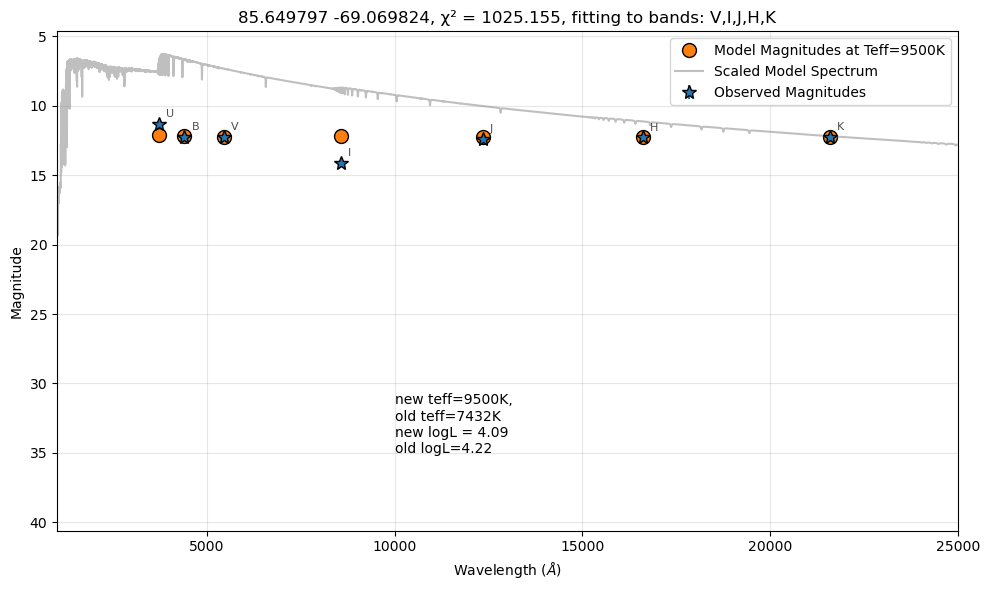

Previous Teff: 7432.002271818373K, logT_old = 3.871105833740972. New fit Teff: 9500K, logT_new = 3.977723605288848


In [69]:
# star matched to the hottest model we have
target_index=802
info(target_index)
new_teff = fit_models_to_star(target_index, show=True)
print(f"Previous Teff: {model_fitting[model_fitting['star_index'] == target_index]['orig_teff'].iloc[0]}K, logT_old = {model_fitting[model_fitting['star_index'] == target_index]['orig_logT'].iloc[0]}. New fit Teff: {model_fitting[model_fitting['star_index'] == target_index]['teff_cut_1'].iloc[0]}K, logT_new = {model_fitting[model_fitting['star_index'] == target_index]['logT_cut_1'].iloc[0]}")

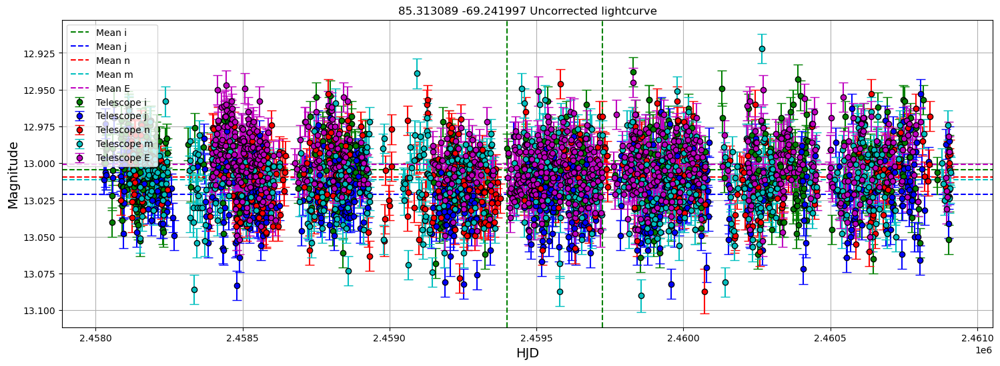

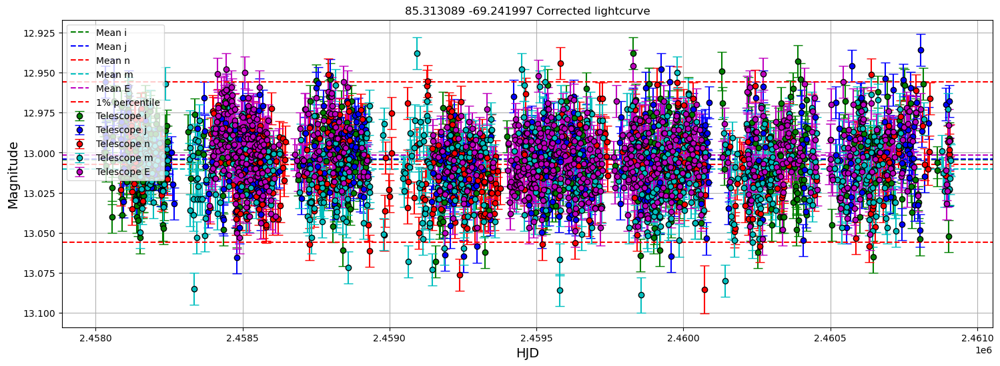

Best frequency: 0.090083 1/day, Best period: 11.10 days, Max power: 0.018, False alarm probability: 1.071e-07
False alarm level for 1.0%: 9.859e-03
Grid sampled at 27024 points


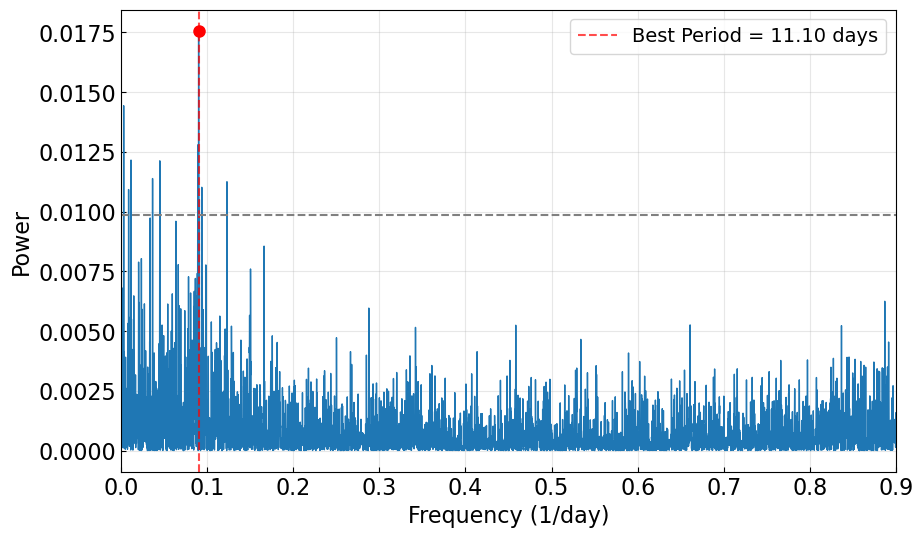

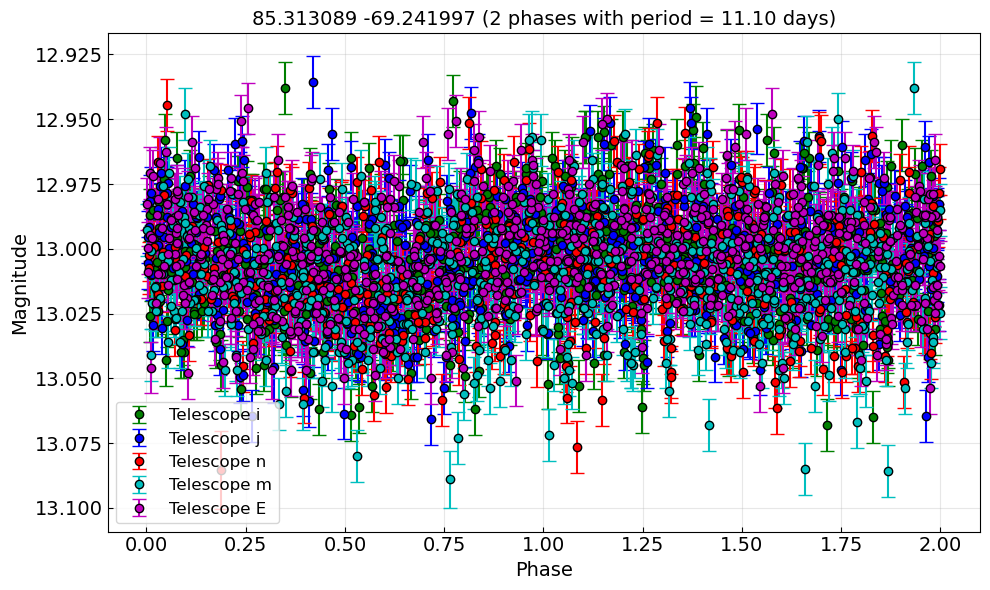

Average scatter (amplitude) per 10 point phase bin: 1.327 mJy


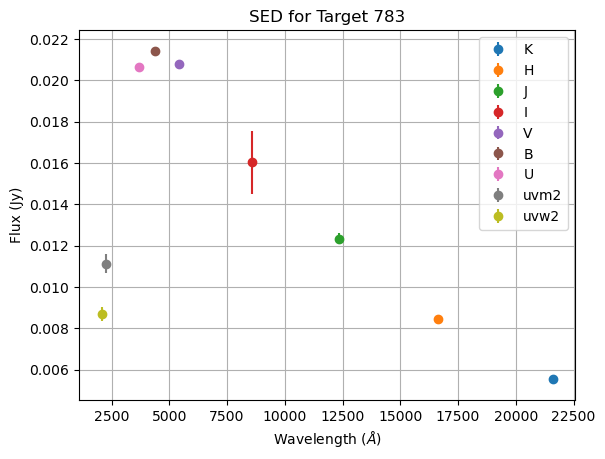

[0.00305755 0.00878158 0.01157704 0.03660303 0.04502269 0.08908442
 0.0900828  0.09094806 0.09377679 0.12299598]
Amplitude metrics:
	Lower 5% percentile: -0.74 mJy, 12.97 mags
	Upper 5% percentile: 0.74 mJy, 13.04 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 5% of data) (g-band: True): 1.49 mJy, 0.07 mags
Amplitude metrics:
	Lower 1% percentile: -1.04 mJy, 12.96 mags
	Upper 1% percentile: 1.06 mJy, 13.06 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 1% of data) (g-band: True): 2.10 mJy, 0.10 mags
	Largest amplitude of variability (g-band: True): 3.20 mJy, 0.15 mags
	Average amplitude across all periods: 1.421 mJy
	Standard deviation of amplitudes: 0.396 mJy


/var/folders/34/3847lqd14j78mfm70_z1c_r00000gn/T/ipykernel_2349/161380346.py:139: RuntimeWarning: divide by zero encountered in log10
  plt.plot(wave['wave'], -2.5 * np.log10(newflux/tmass_k_zp), #+ plot_mag_shift,


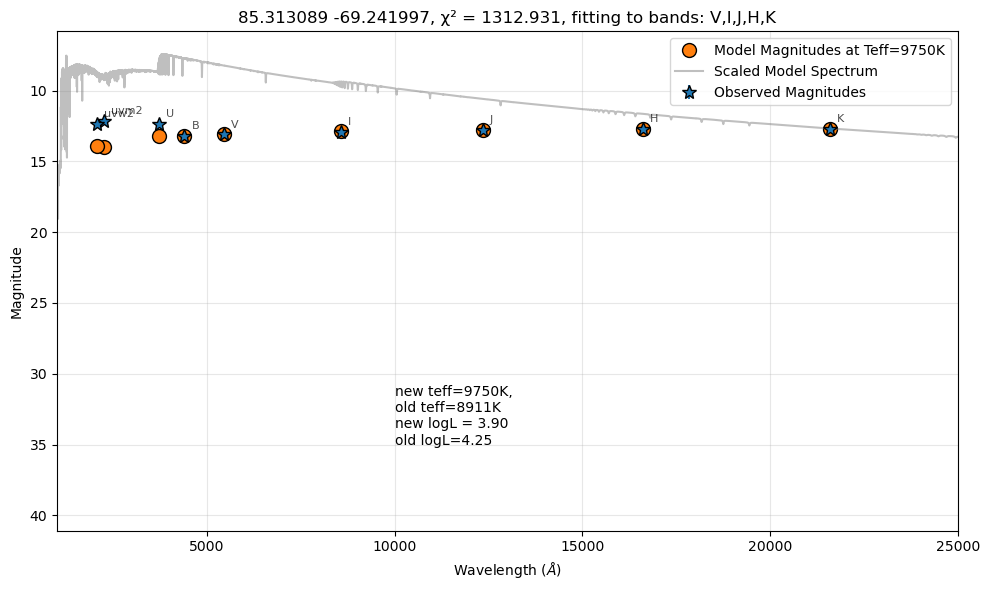

Previous Teff: 8911.335351460775K, logT_old = 3.949942787349709. New fit Teff: 9750K, logT_new = 3.989004615698537


In [70]:
# star matched to be 600 K hotter
target_index=783
info(target_index)
new_teff = fit_models_to_star(target_index, show=True)
print(f"Previous Teff: {model_fitting[model_fitting['star_index'] == target_index]['orig_teff'].iloc[0]}K, logT_old = {model_fitting[model_fitting['star_index'] == target_index]['orig_logT'].iloc[0]}. New fit Teff: {model_fitting[model_fitting['star_index'] == target_index]['teff_cut_1'].iloc[0]}K, logT_new = {model_fitting[model_fitting['star_index'] == target_index]['logT_cut_1'].iloc[0]}")

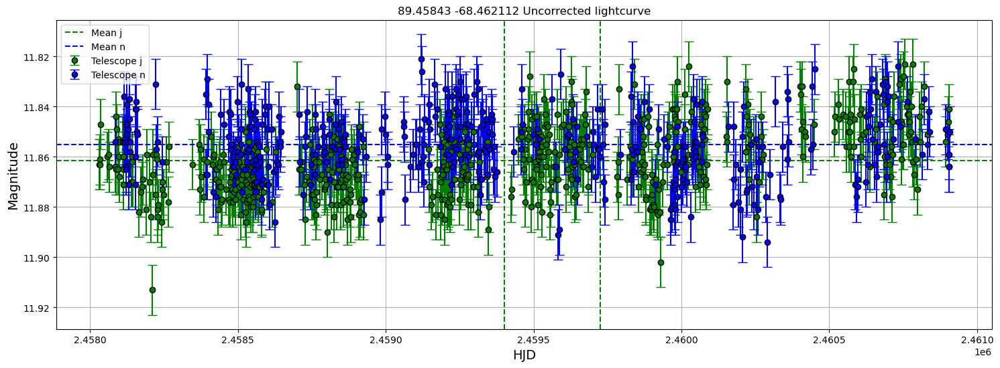

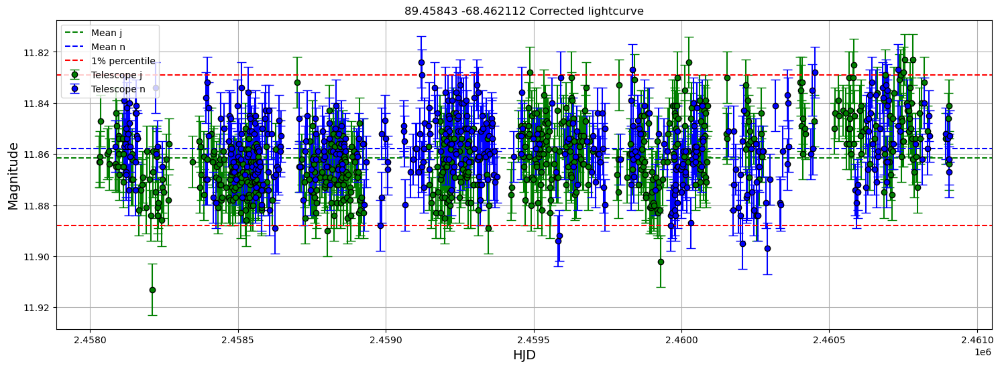

Best frequency: 0.224609 1/day, Best period: 4.45 days, Max power: 0.183, False alarm probability: 1.239e-40
False alarm level for 1.0%: 2.672e-02
Grid sampled at 9118 points


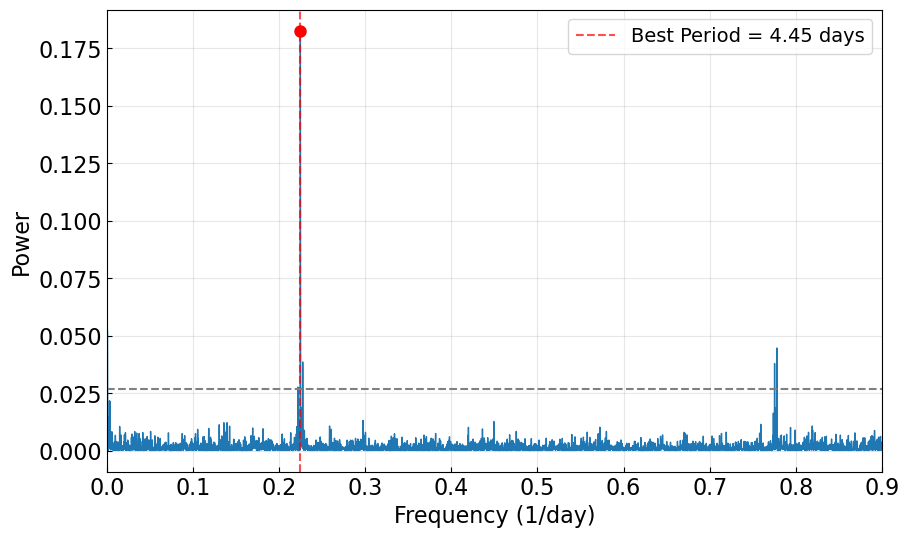

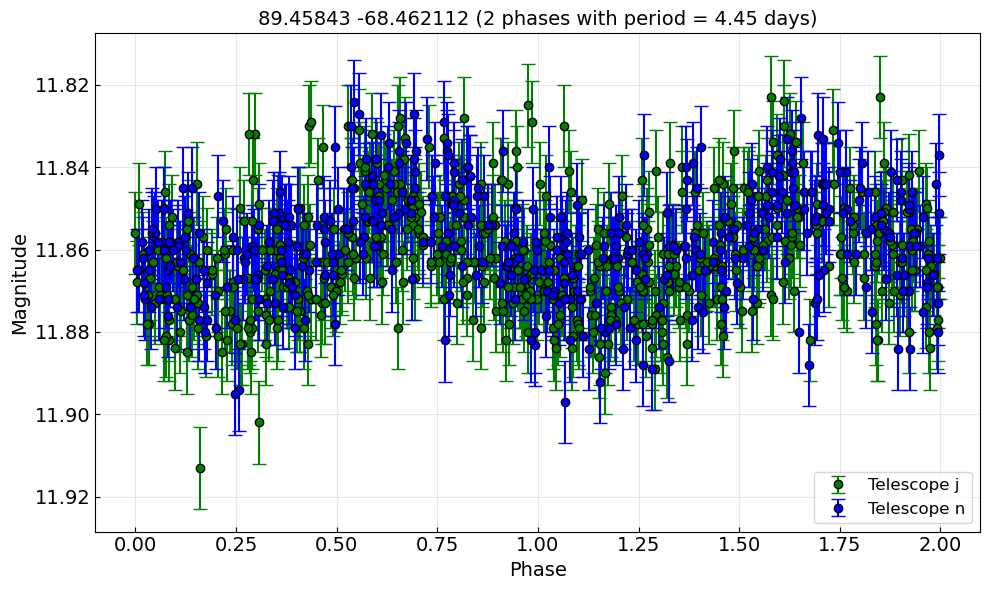

Average scatter (amplitude) per 10 point phase bin: 2.084 mJy


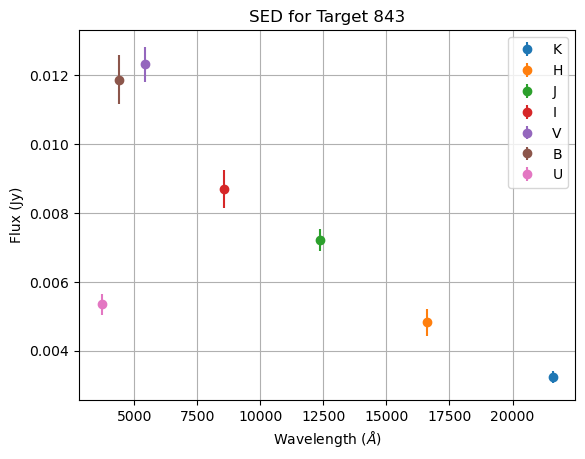

[0.22194568 0.22460897 0.22737091 0.7753185  0.77808043]
Amplitude metrics:
	Lower 5% percentile: -1.22 mJy, 11.84 mags
	Upper 5% percentile: 1.42 mJy, 11.88 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 5% of data) (g-band: True): 2.64 mJy, 0.04 mags
Amplitude metrics:
	Lower 1% percentile: -1.62 mJy, 11.83 mags
	Upper 1% percentile: 1.94 mJy, 11.89 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 1% of data) (g-band: True): 3.57 mJy, 0.06 mags
	Largest amplitude of variability (g-band: True): 5.37 mJy, 0.09 mags
	Average amplitude across all periods: 1.135 mJy
	Standard deviation of amplitudes: 0.706 mJy


/var/folders/34/3847lqd14j78mfm70_z1c_r00000gn/T/ipykernel_2349/161380346.py:139: RuntimeWarning: divide by zero encountered in log10
  plt.plot(wave['wave'], -2.5 * np.log10(newflux/tmass_k_zp), #+ plot_mag_shift,


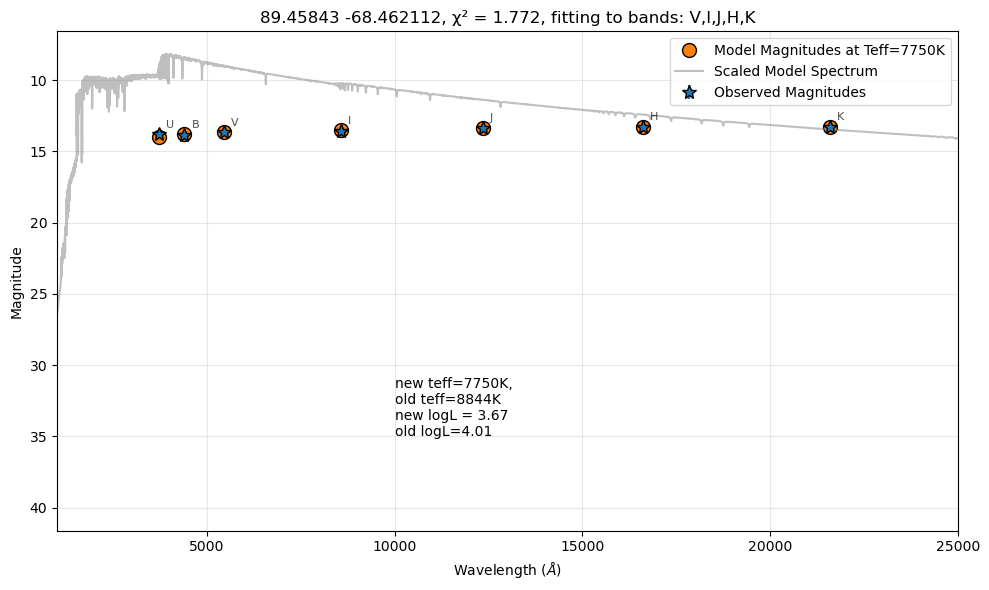

Previous Teff: 8844.489221995229K, logT_old = 3.946672757033846. New fit Teff: 7750K, logT_new = 3.88930170250631


In [71]:
# star cooler by 1000K but still quite hot
target_index=843
info(target_index)
new_teff = fit_models_to_star(target_index, show=True)
print(f"Previous Teff: {model_fitting[model_fitting['star_index'] == target_index]['orig_teff'].iloc[0]}K, logT_old = {model_fitting[model_fitting['star_index'] == target_index]['orig_logT'].iloc[0]}. New fit Teff: {model_fitting[model_fitting['star_index'] == target_index]['teff_cut_1'].iloc[0]}K, logT_new = {model_fitting[model_fitting['star_index'] == target_index]['logT_cut_1'].iloc[0]}")

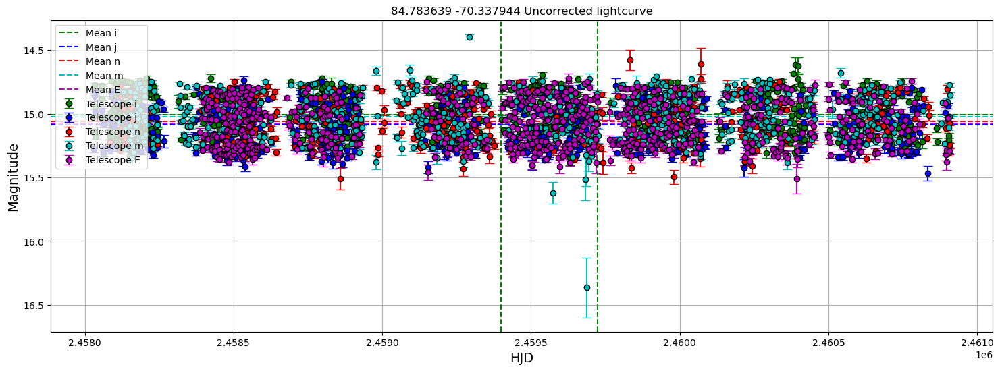

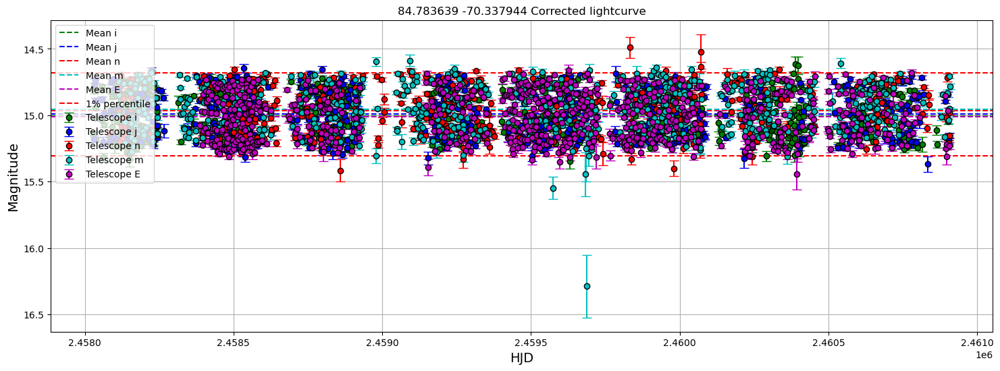

Best frequency: 0.125592 1/day, Best period: 7.96 days, Max power: 0.859, False alarm probability: 0.000e+00
False alarm level for 1.0%: 9.858e-03
Grid sampled at 27024 points


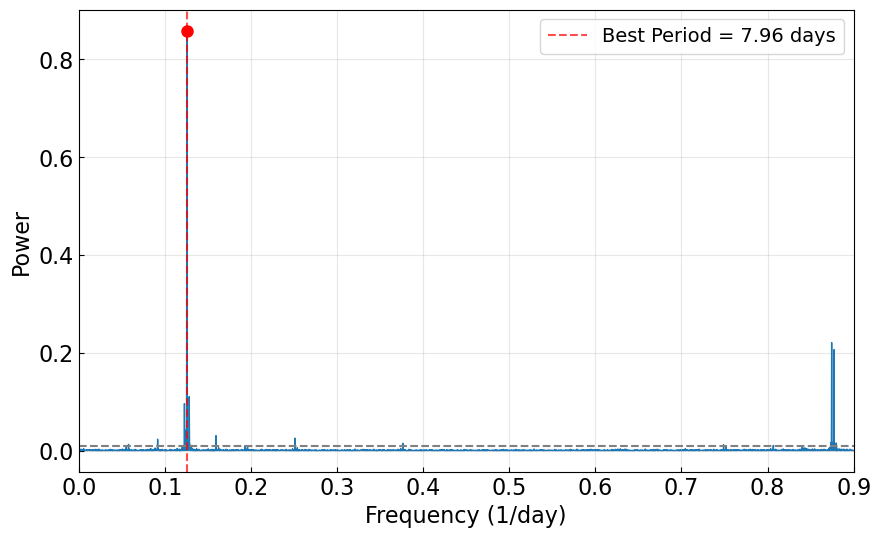

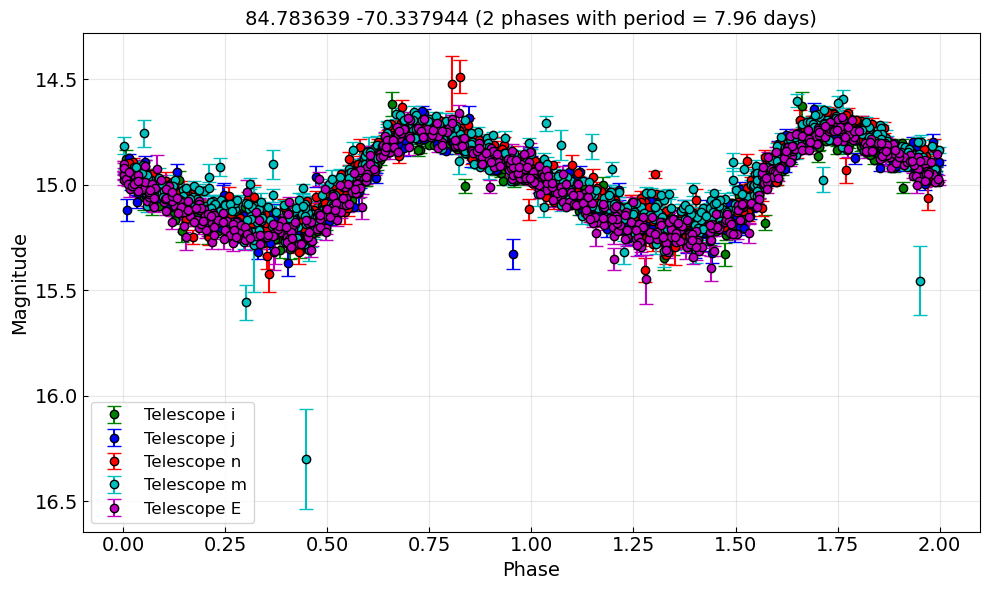

Average scatter (amplitude) per 10 point phase bin: 0.542 mJy


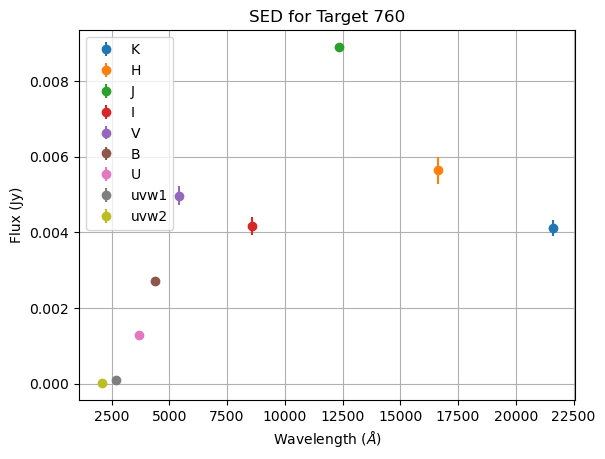

[0.05786848 0.09171348 0.12229711 0.1227963  0.1247265  0.12505929
 0.12559176 0.12609095 0.12645702 0.12785475 0.12838722 0.12881985
 0.15947004 0.19331504 0.25115439 0.37675029 0.74891219 0.80665169
 0.87357627 0.87394234 0.87444153 0.87494072 0.87563959 0.87720371
 0.87800241 0.87883439 0.87973293]
Amplitude metrics:
	Lower 5% percentile: -0.74 mJy, 14.73 mags
	Upper 5% percentile: 1.01 mJy, 15.24 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 5% of data) (g-band: True): 1.75 mJy, 0.51 mags
Amplitude metrics:
	Lower 1% percentile: -0.92 mJy, 14.68 mags
	Upper 1% percentile: 1.21 mJy, 15.30 mags
	Percentile amplitude of variability (excluding the brightest and dimmest 1% of data) (g-band: True): 2.13 mJy, 0.62 mags
	Largest amplitude of variability (g-band: True): 4.71 mJy, 1.80 mags
	Average amplitude across all periods: 1.718 mJy
	Standard deviation of amplitudes: 0.332 mJy
	Average amplitude (1.718 mJy) is greater than 5 sigma (0.332 mJy). This indi

/var/folders/34/3847lqd14j78mfm70_z1c_r00000gn/T/ipykernel_2349/161380346.py:139: RuntimeWarning: divide by zero encountered in log10
  plt.plot(wave['wave'], -2.5 * np.log10(newflux/tmass_k_zp), #+ plot_mag_shift,


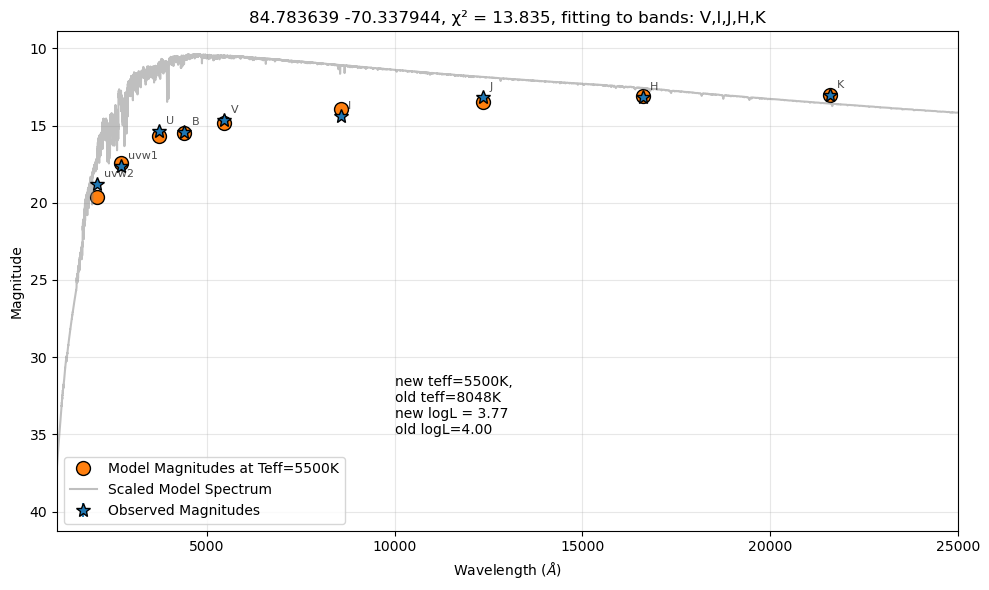

Previous Teff: 8048.05859979364K, logT_old = 3.905691129922882. New fit Teff: 5500K, logT_new = 3.740362689494244


In [72]:
# star much cooler than previous estimate (Teff = 8000K down to 5500K)
target_index=760
info(target_index)
new_teff = fit_models_to_star(target_index, show=True)
print(f"Previous Teff: {model_fitting[model_fitting['star_index'] == target_index]['orig_teff'].iloc[0]}K, logT_old = {model_fitting[model_fitting['star_index'] == target_index]['orig_logT'].iloc[0]}. New fit Teff: {model_fitting[model_fitting['star_index'] == target_index]['teff_cut_1'].iloc[0]}K, logT_new = {model_fitting[model_fitting['star_index'] == target_index]['logT_cut_1'].iloc[0]}")